# **Hardware and Software for Big Data - Final Project**

## Prof. Giancarlo Sperli


#### Rabia Simal CAPAR

## Initial Steps

Installing all required libraries

In [1]:
!pip install pandas matplotlib seaborn scikit-learn
!pip install statsmodels tensorflow
!pip install pyspark
!pip install kafka-python
!pip install yfinance --upgrade --no-cache-dir
!pip install schedule

Import libraries

In [2]:
# Import all required libraries
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split
from datetime import datetime
import time
import threading
import json
from kafka import KafkaProducer
from kafka.errors import KafkaError
from sklearn.model_selection import train_test_split
import pandas as pd
import requests
import yfinance as yf
import schedule

/usr/local/lib/python3.10/dist-packages/yfinance/base.py:48: FutureWarning: The default dtype for empty Series will be 'object' instead of 'float64' in a future version. Specify a dtype explicitly to silence this warning.
  _empty_series = pd.Series()


Download Kafka for Data Streaming

In [3]:
#download and extract the Kafka distribution from the Apache archive.
!curl -sSOL https://archive.apache.org/dist/kafka/3.3.1/kafka_2.13-3.3.1.tgz
!tar -xzf kafka_2.13-3.3.1.tgz

Start the Zookeeper and Kafka servers

In [3]:
# Start the Zookeeper and Kafka servers using the provided scripts from the Kafka package,
# And a notification to wait for 10 seconds to allow these services to initialize.
!./kafka_2.13-3.3.1/bin/zookeeper-server-start.sh -daemon ./kafka_2.13-3.3.1/config/zookeeper.properties
!./kafka_2.13-3.3.1/bin/kafka-server-start.sh -daemon ./kafka_2.13-3.3.1/config/server.properties
!echo "Waiting for 10 seconds until KAFKA and ZOOKEEPER services are up and running"
!sleep 10

Waiting for 10 seconds until KAFKA and ZOOKEEPER services are up and running


# Downloading the Dataset

In [4]:
# List of cryptocurrency symbols

CryptoSymbs = ['BTC-USD', 'ETH-USD', 'USDT-USD', 'BNB-USD', 'XRP-USD', 'WXRP-USD', 'SOL-USD',
                  'USDC-USD', 'ADA-USD', 'STETH-USD', 'AVAX-USD', 'DOGE-USD', 'DOT-USD', 'WOO-USD',
                  'TRX-USD', 'LINK-USD', 'MATIC-USD', 'WBTC-USD', 'SHIB-USD', 'LTC-USD',
                  'DAI-USD', 'UNI-USD', 'BCH-USD', 'ICP-USD', 'XLM-USD', 'OKB-USD', 'LEO-USD',
                  'ATOM-USD', 'ETC-USD', 'HBAR-USD', 'CRO-USD', 'INJ-USD', 'WHBAR-USD', 'CFX-USD',
                  'KAS-USD', 'FIL-USD', 'APT-USD', 'TUSD-USD', 'NEAR-USD', 'VET-USD', 'TIA-USD',
                  'OP-USD', 'LDO-USD', 'MNT-USD', 'RUNE-USD', 'RNDR-USD', 'EGLD-USD', 'HEX-USD',
                  'FDUSD-USD', 'QNT-USD', 'ALGO-USD', 'AAVE-USD', 'BONK-USD', 'STX-USD', 'XDC-USD',
                  'ARB-USD', 'SNX-USD', 'RETH-USD', 'MKR-USD', 'FTM-USD', 'HNT-USD', 'BTT-USD',
                  'BUSD-USD', 'WEMIX-USD', 'FLOW-USD', 'BEAM-USD', 'ORDI-USD', 'THETA-USD',
                  'SAND-USD', 'KCS-USD', 'LUNC-USD', 'OSMO-USD', 'BSV-USD', 'AXS-USD', 'MANA-USD',
                  'NEO-USD', 'GALA-USD', 'IOTA-USD', 'EOS-USD', 'KLAY-USD', 'KAVA-USD', 'GALA-USD']

Download a 6-months of crypto currency dataset from yahoo finance.

In [5]:
import yfinance as yf

# Define a dictionary to store data
CryptCurr_df = {}

# Function to download crypto currency data
def download_crypt_df():
    for ticker in CryptoSymbs:
        CryptCurr_df[ticker] = yf.download(ticker, period='6mo', interval='1d', group_by='ticker')
    print("\nData downloaded at:", time.strftime("%Y-%m-%d %H:%M:%S"))
    print("\nNumber of successful downloaded cryptocurrency info:", len(CryptCurr_df), "\n")

# Download data
download_crypt_df()


[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%**********************]  1 of 1 completed
[*********************100%%*******


Data downloaded at: 2024-02-09 22:12:28

Number of successful downloaded cryptocurrency info: 81 



Start the scheduler

In [6]:
import schedule
import time
import threading

def scheduler():
    schedule.every(40).minutes.do(download_crypt_df)  # For example, update every 40 minutes.
    while True:
        schedule.run_pending()
        time.sleep(1)

# Start the scheduler in a separate thread.
scheduler_thread = threading.Thread(target=scheduler)
scheduler_thread.start()


# Data Preprocessing

Data Cleaning,
Removing Unnecessary Columns

In [7]:
for ticker, df in CryptCurr_df.items():
    if 'Adj Close' in df.columns:
        df.drop('Adj Close', axis=1, inplace=True)


Processing Missing Data,
Filling or Removing Missing Values

In [8]:
# Filling missing values with the mean
for ticker, df in CryptCurr_df.items():
    CryptCurr_df[ticker] = df.fillna(df.mean())
    print(f"Data for {ticker}:")
    print(CryptCurr_df[ticker], "\n")

Data for BTC-USD:
                    Open          High           Low         Close  \
Date                                                                 
2023-08-09  29766.695312  30093.435547  29376.800781  29561.494141   
2023-08-10  29563.972656  29688.564453  29354.447266  29429.591797   
2023-08-11  29424.902344  29517.773438  29253.517578  29397.714844   
2023-08-12  29399.787109  29465.113281  29357.587891  29415.964844   
2023-08-13  29416.593750  29441.433594  29265.806641  29282.914062   
...                  ...           ...           ...           ...   
2024-02-05  42577.621094  43494.250000  42264.816406  42658.667969   
2024-02-06  42657.390625  43344.148438  42529.019531  43084.671875   
2024-02-07  43090.019531  44341.949219  42775.957031  44318.222656   
2024-02-08  44332.125000  45575.839844  44332.125000  45301.566406   
2024-02-09  45297.382812  48152.496094  45260.824219  47558.789062   

                 Volume  
Date                     
2023-08-09  1837952

Data Inspection

In [9]:
#Show the first 5 rows of each crypto type.
for ticker, df in CryptCurr_df.items():
    print(f"Data for {ticker}:")
    print(df.head(), "\n")


Data for BTC-USD:
                    Open          High           Low         Close  \
Date                                                                 
2023-08-09  29766.695312  30093.435547  29376.800781  29561.494141   
2023-08-10  29563.972656  29688.564453  29354.447266  29429.591797   
2023-08-11  29424.902344  29517.773438  29253.517578  29397.714844   
2023-08-12  29399.787109  29465.113281  29357.587891  29415.964844   
2023-08-13  29416.593750  29441.433594  29265.806641  29282.914062   

                 Volume  
Date                     
2023-08-09  18379521213  
2023-08-10  11865344789  
2023-08-11  10195168197  
2023-08-12   6194358008  
2023-08-13   7329897180   

Data for ETH-USD:
                   Open         High          Low        Close      Volume
Date                                                                      
2023-08-09  1855.779419  1869.736572  1845.489746  1854.297607  5870081833
2023-08-10  1854.348267  1863.310913  1845.442261  1850.753418  

# Feature Engineering

Exploratory Data Analysis (EDA) Examining Data Distributions

In [10]:
import matplotlib.pyplot as plt
import seaborn as sns

CryptCurr_df_Summary = {}

# Since CryptCurr_df is the dictionary of DataFrames
for ticker, df in CryptCurr_df.items():
    # Summary Statistics
    print(f"\nSummary Statistics for {ticker}:")
    CryptCurr_df_Summary[ticker] = df.describe()
    print(df.describe())


Summary Statistics for BTC-USD:
               Open          High           Low         Close        Volume
count    185.000000    185.000000    185.000000    185.000000  1.850000e+02
mean   34947.757179  35549.308953  34429.349821  35043.507654  1.865291e+10
std     7136.320522   7360.799740   6934.009942   7185.776369  9.180752e+09
min    25160.658203  25858.375000  24930.296875  25162.654297  5.331173e+09
25%    27162.628906  27488.763672  26817.894531  27159.652344  1.186534e+10
50%    35548.113281  36704.484375  35147.800781  35655.277344  1.679848e+10
75%    42261.300781  43124.324219  41692.968750  42270.527344  2.351278e+10
max    46987.640625  48969.371094  45678.644531  47558.789062  5.011461e+10

Summary Statistics for ETH-USD:
              Open         High          Low        Close        Volume
count   185.000000   185.000000   185.000000   185.000000  1.850000e+02
mean   1966.679378  2002.252706  1933.720064  1970.135376  8.454121e+09
std     314.170355   327.516371   

Plotting Histrograms for the Summary Statistics of Each Crypto Type

<Figure size 1000x600 with 0 Axes>

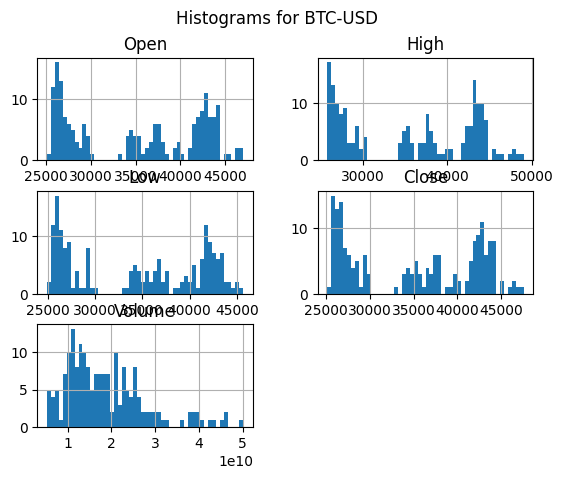

<Figure size 1000x600 with 0 Axes>

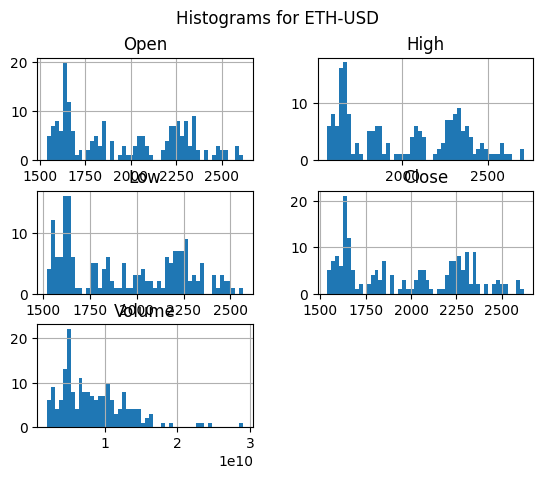

<Figure size 1000x600 with 0 Axes>

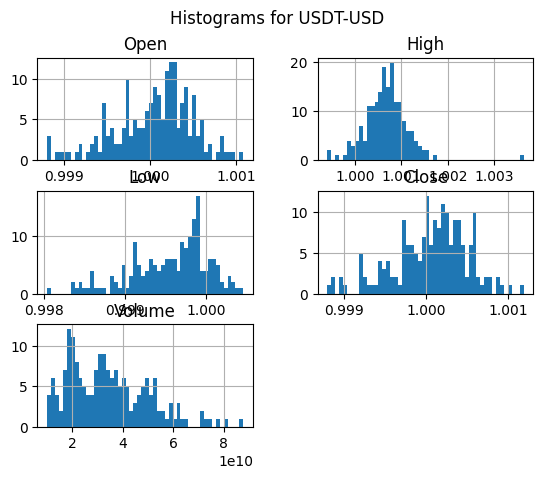

<Figure size 1000x600 with 0 Axes>

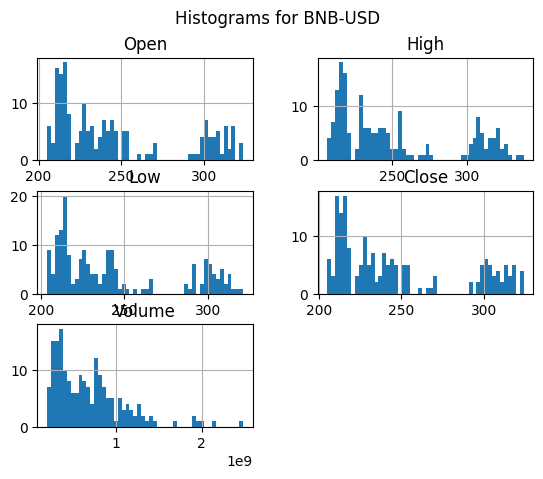

<Figure size 1000x600 with 0 Axes>

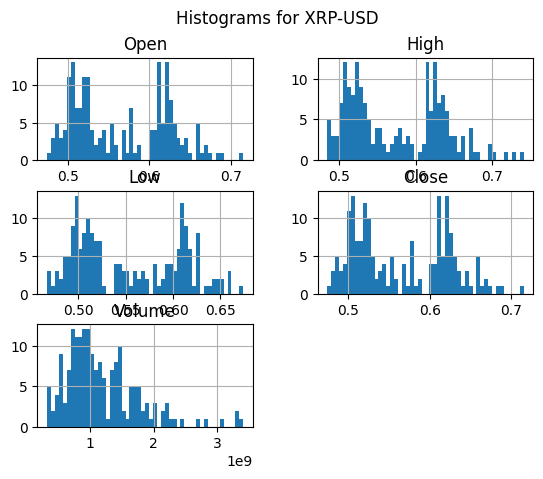

<Figure size 1000x600 with 0 Axes>

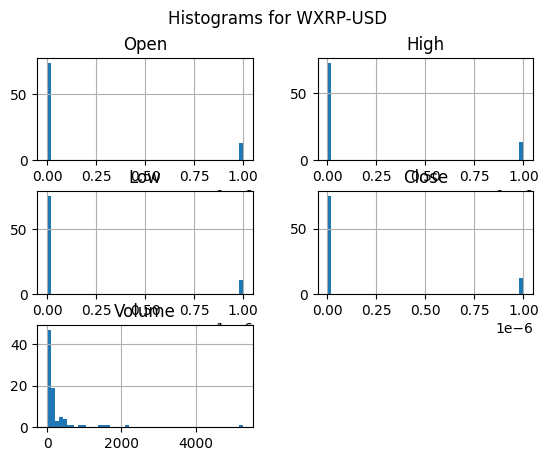

<Figure size 1000x600 with 0 Axes>

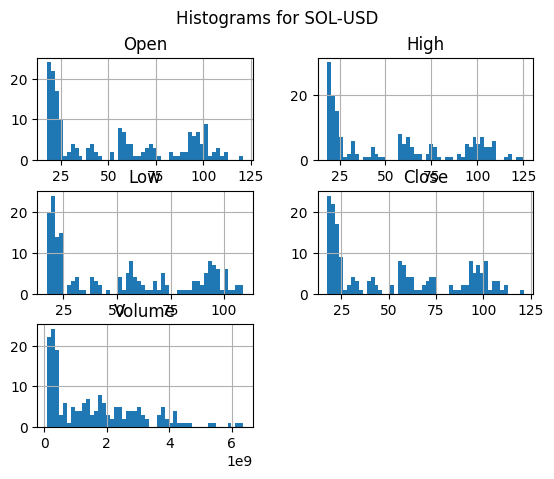

<Figure size 1000x600 with 0 Axes>

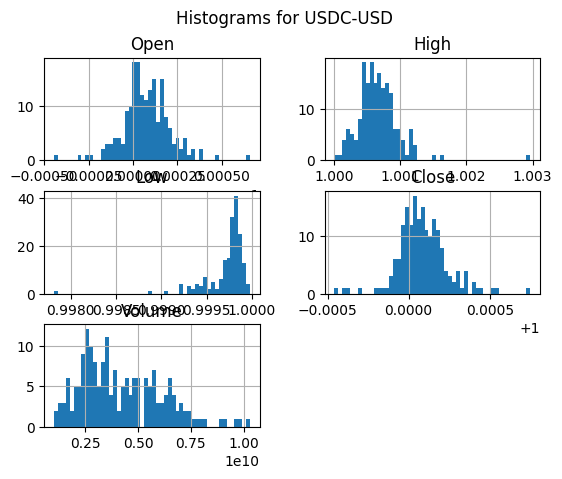

<Figure size 1000x600 with 0 Axes>

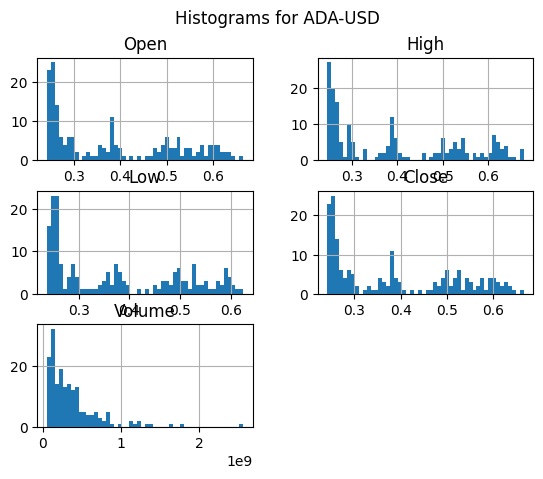

<Figure size 1000x600 with 0 Axes>

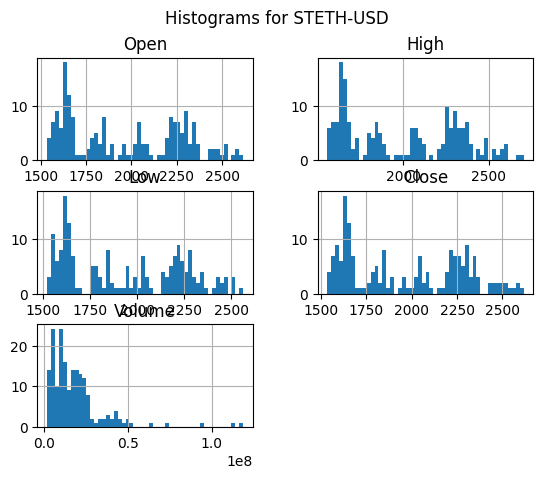

<Figure size 1000x600 with 0 Axes>

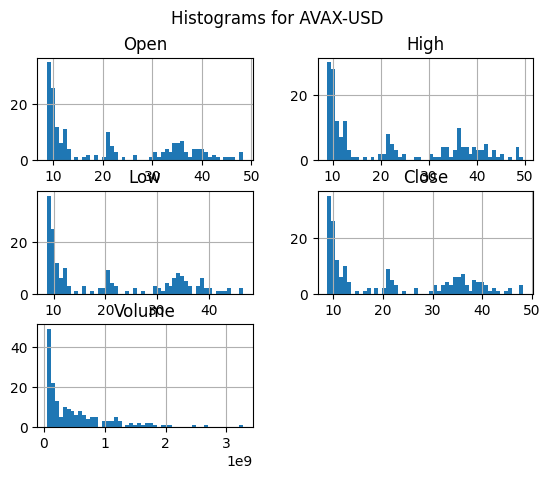

<Figure size 1000x600 with 0 Axes>

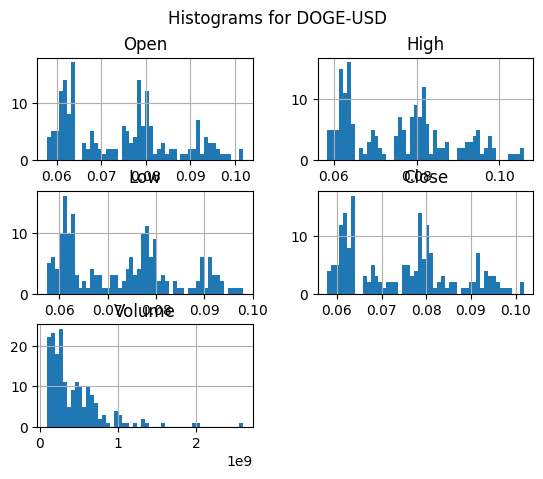

<Figure size 1000x600 with 0 Axes>

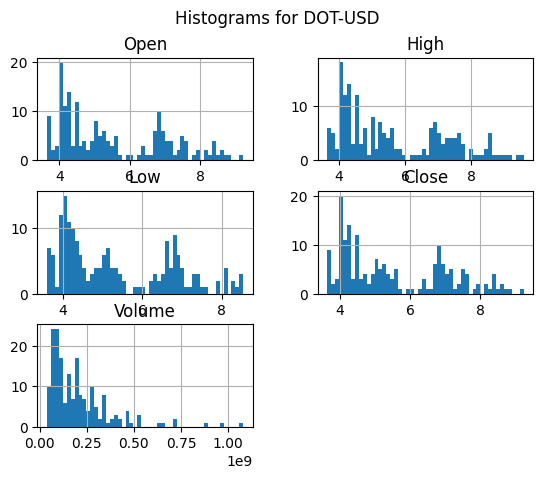

<Figure size 1000x600 with 0 Axes>

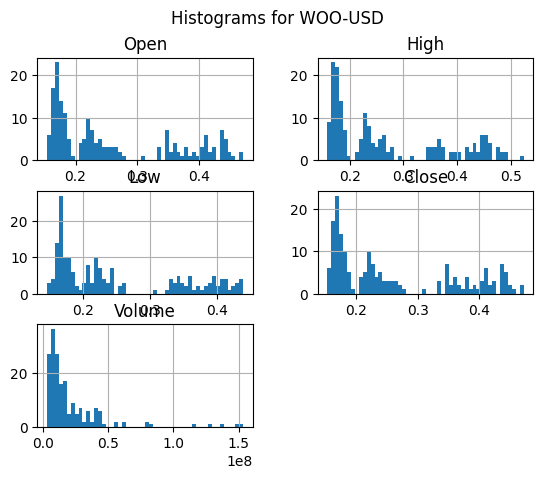

<Figure size 1000x600 with 0 Axes>

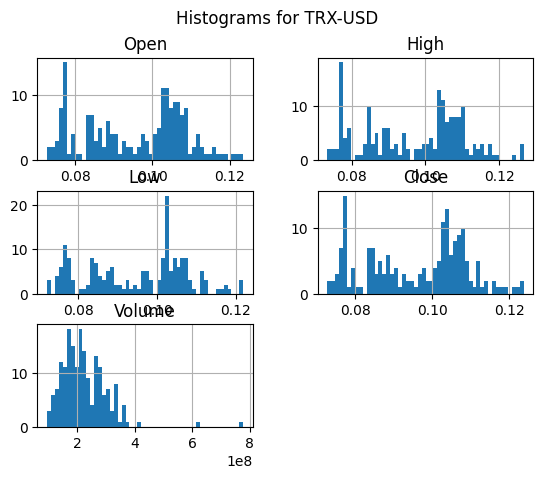

<Figure size 1000x600 with 0 Axes>

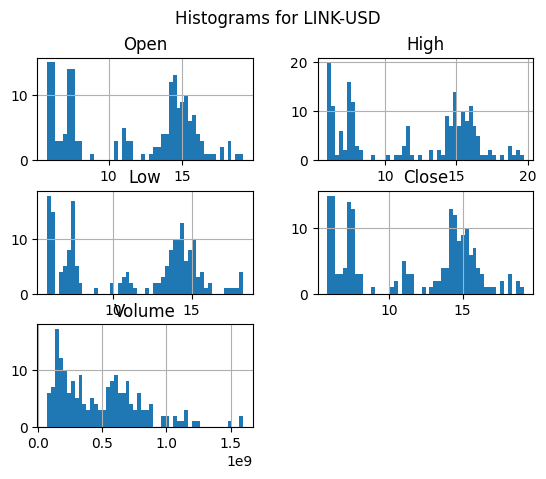

<Figure size 1000x600 with 0 Axes>

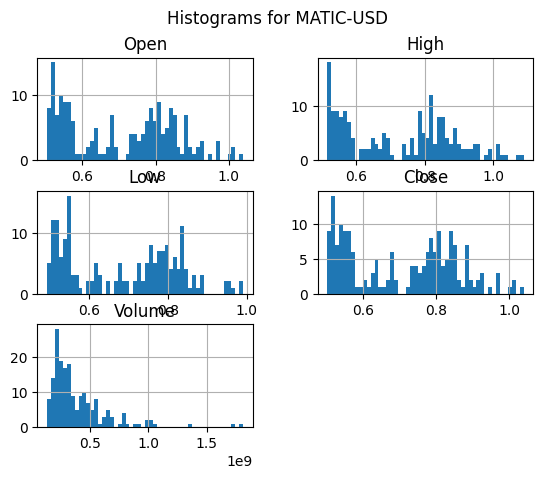

<Figure size 1000x600 with 0 Axes>

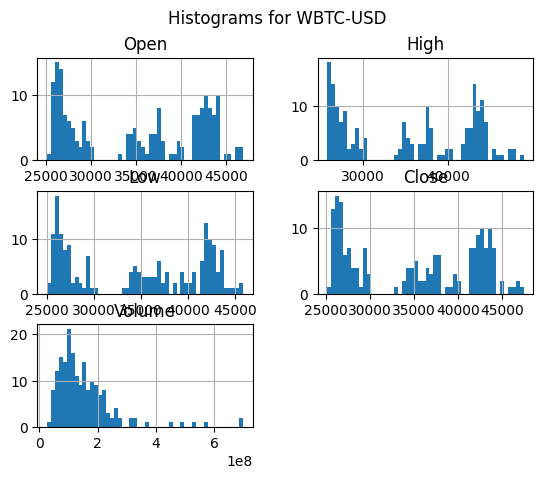

<Figure size 1000x600 with 0 Axes>

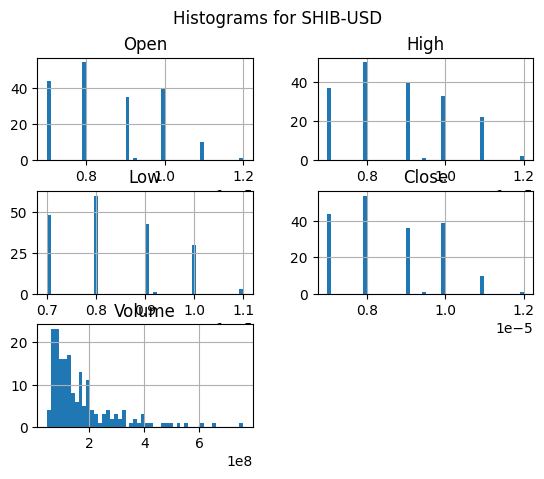

<Figure size 1000x600 with 0 Axes>

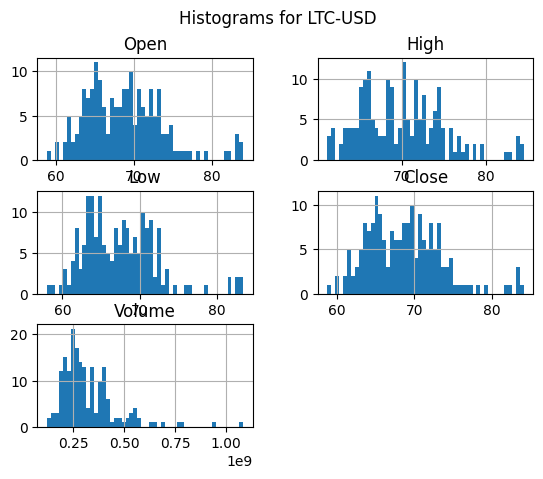

<Figure size 1000x600 with 0 Axes>

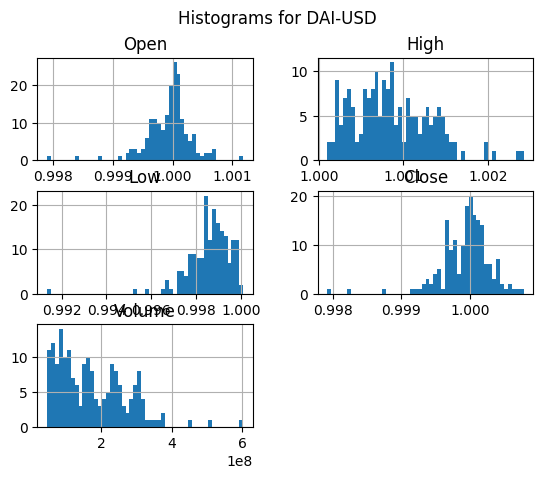

<Figure size 1000x600 with 0 Axes>

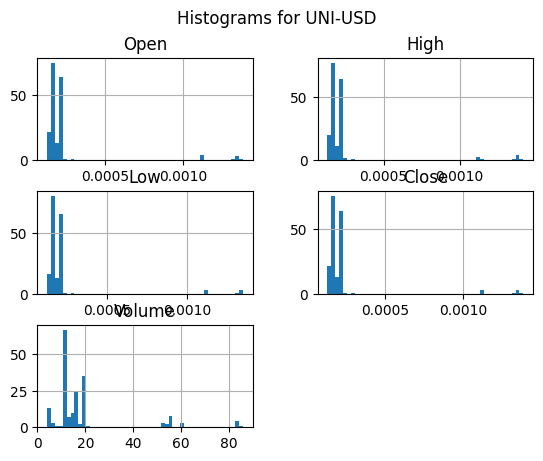

<Figure size 1000x600 with 0 Axes>

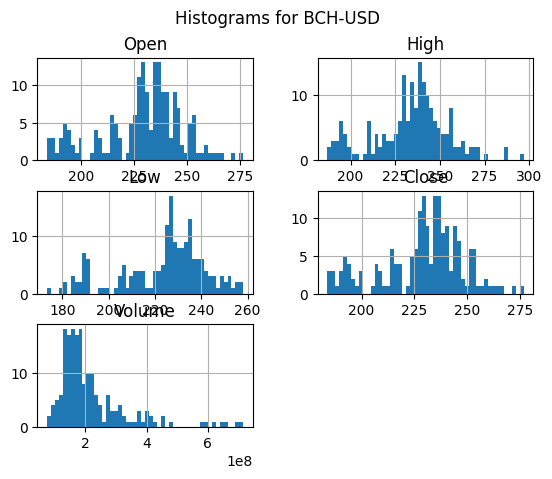

<Figure size 1000x600 with 0 Axes>

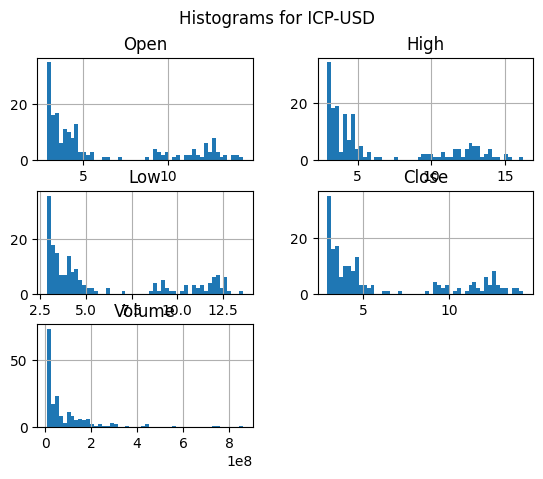

<Figure size 1000x600 with 0 Axes>

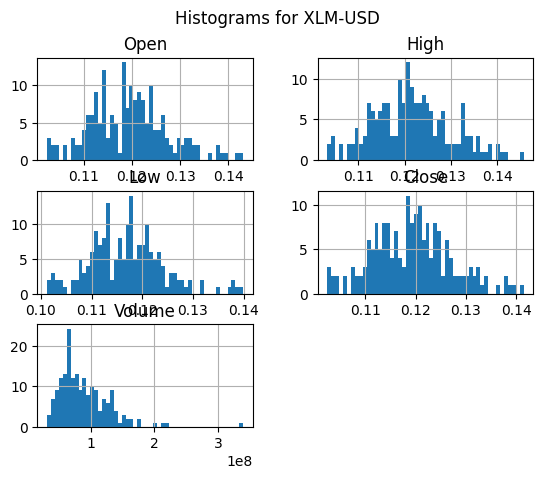

<Figure size 1000x600 with 0 Axes>

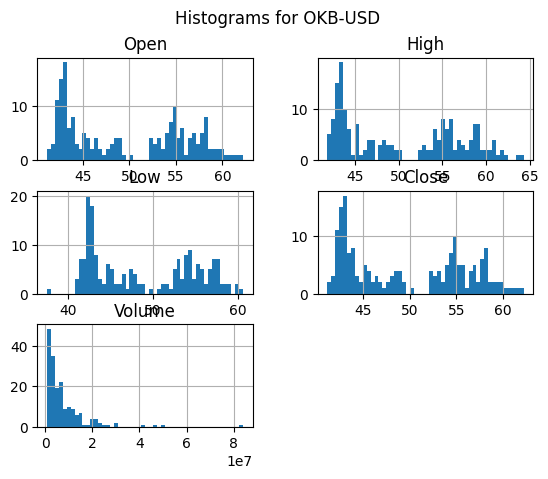

<Figure size 1000x600 with 0 Axes>

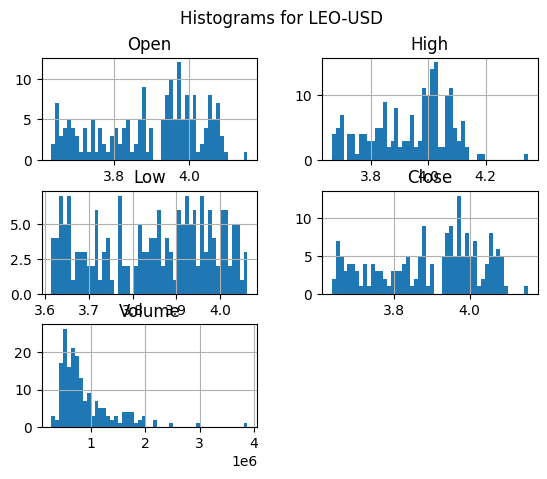

<Figure size 1000x600 with 0 Axes>

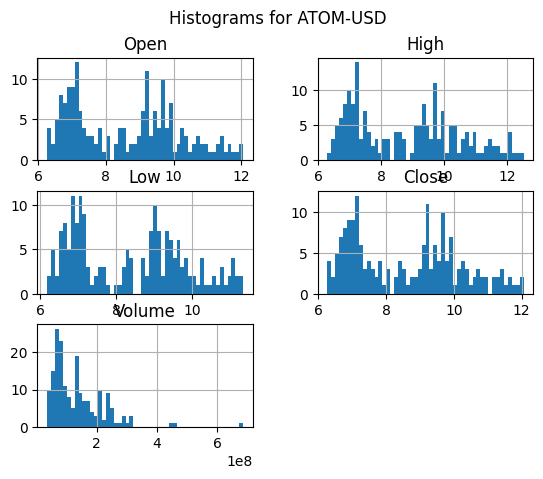

<Figure size 1000x600 with 0 Axes>

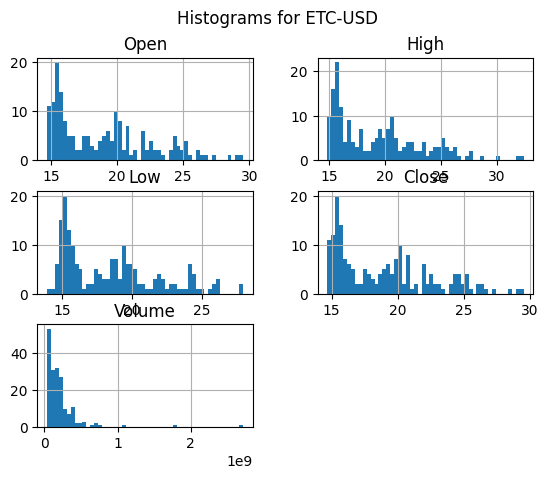

<Figure size 1000x600 with 0 Axes>

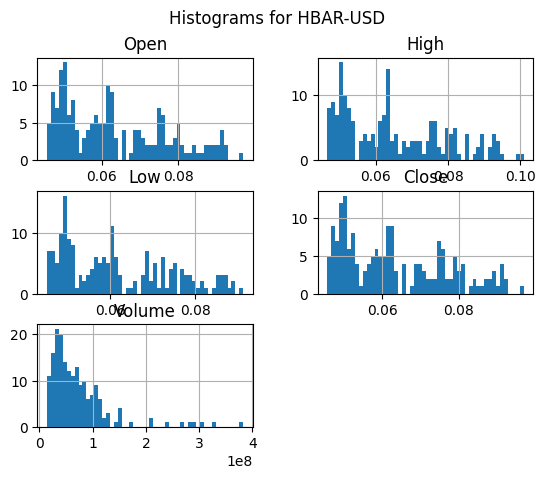

<Figure size 1000x600 with 0 Axes>

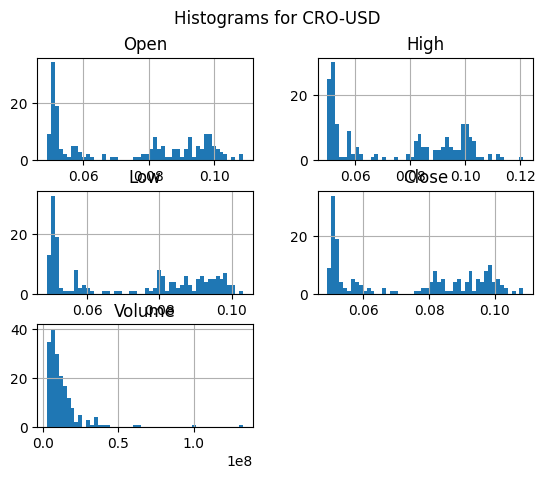

<Figure size 1000x600 with 0 Axes>

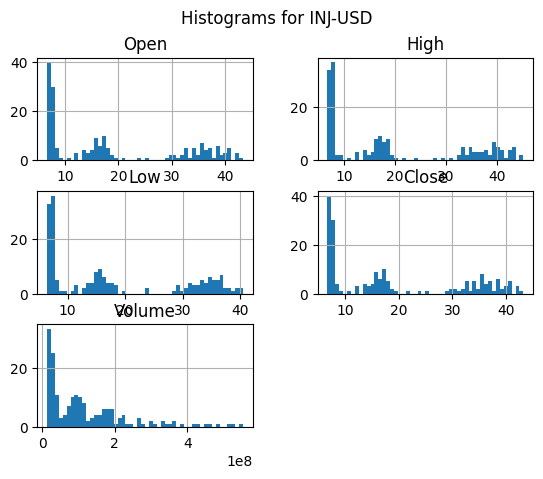

<Figure size 1000x600 with 0 Axes>

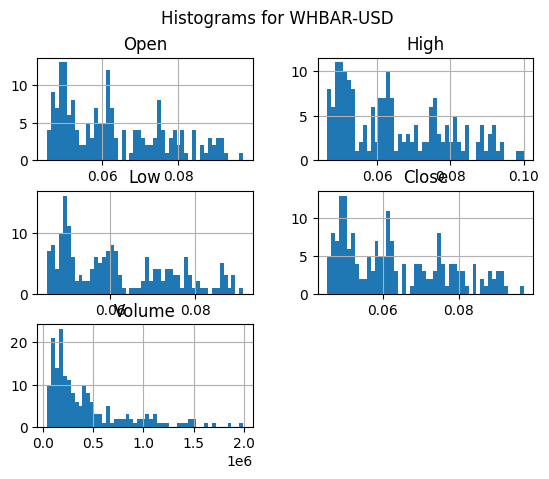

<Figure size 1000x600 with 0 Axes>

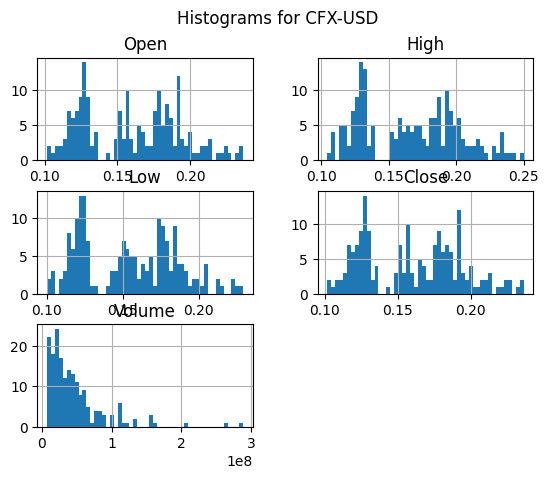

<Figure size 1000x600 with 0 Axes>

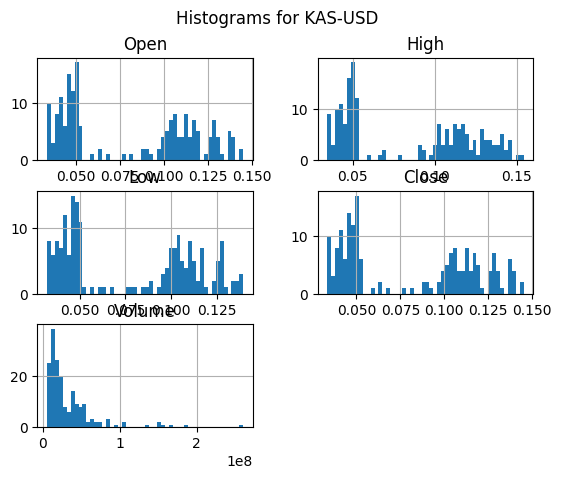

<Figure size 1000x600 with 0 Axes>

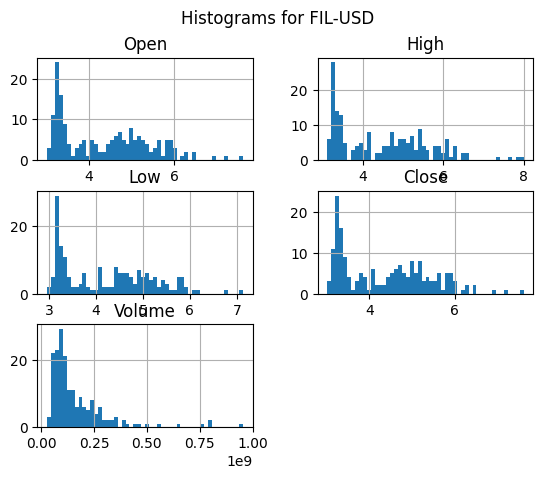

<Figure size 1000x600 with 0 Axes>

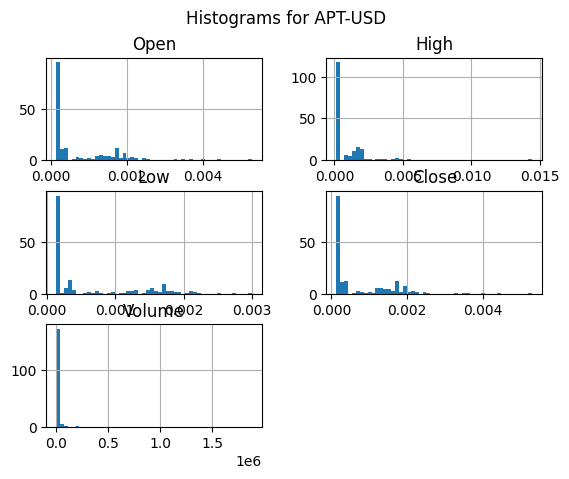

<Figure size 1000x600 with 0 Axes>

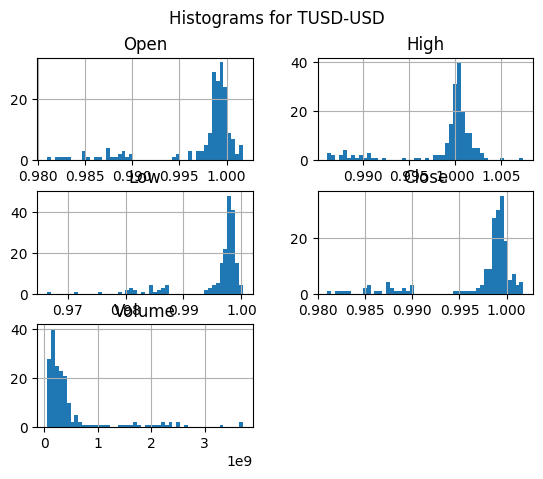

<Figure size 1000x600 with 0 Axes>

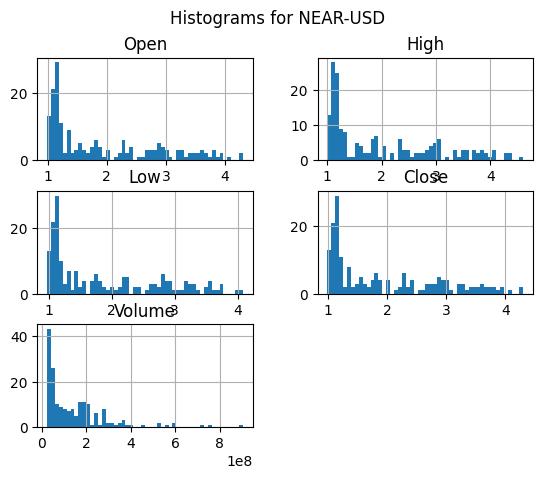

<Figure size 1000x600 with 0 Axes>

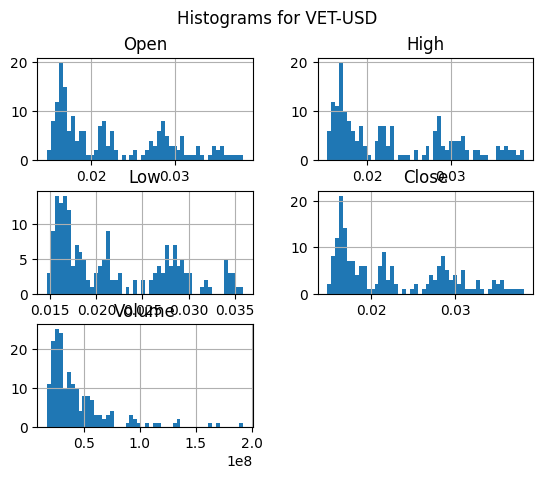

<Figure size 1000x600 with 0 Axes>

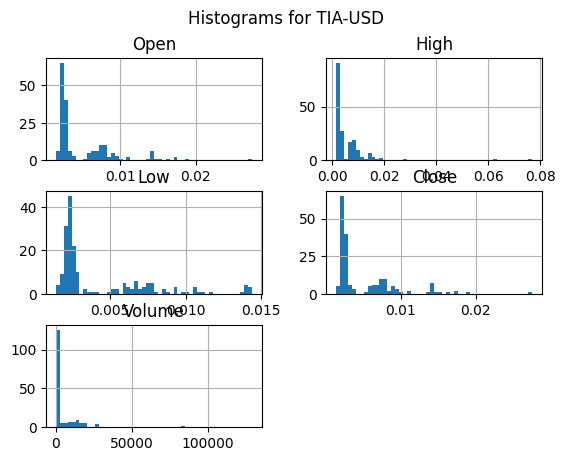

<Figure size 1000x600 with 0 Axes>

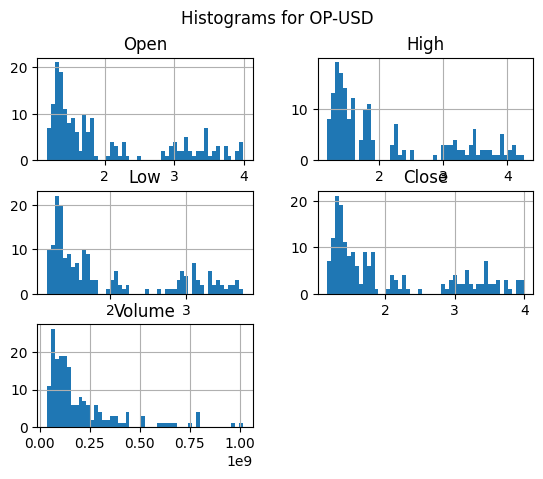

<Figure size 1000x600 with 0 Axes>

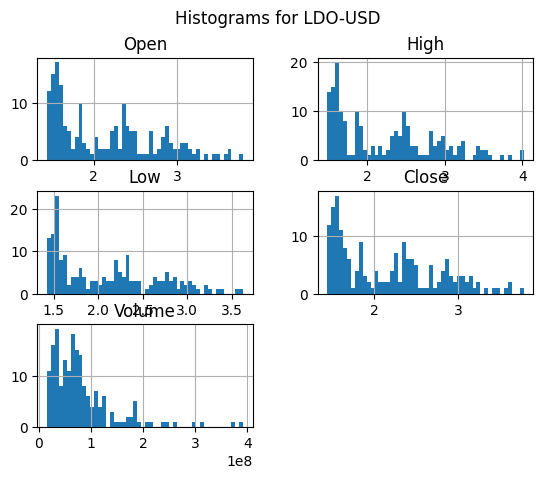

<Figure size 1000x600 with 0 Axes>

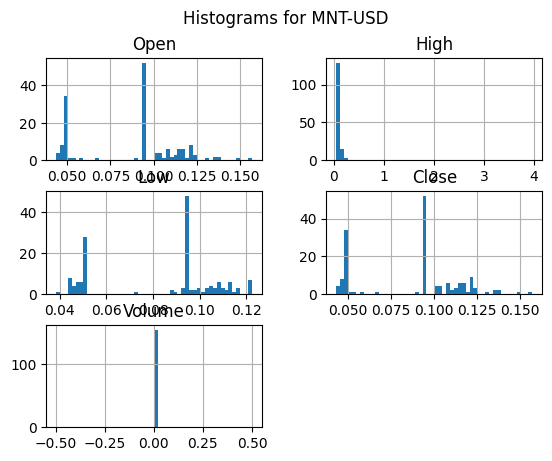

<Figure size 1000x600 with 0 Axes>

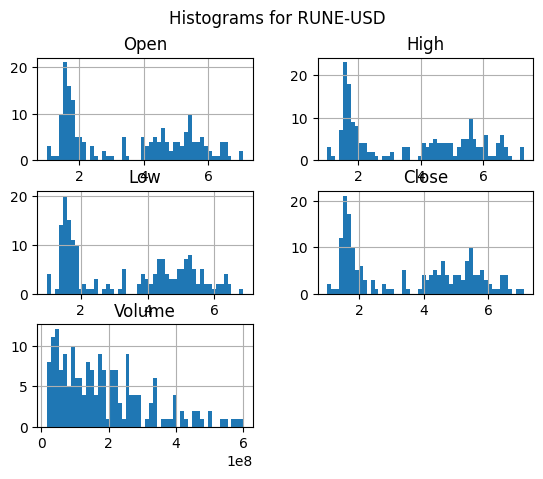

<Figure size 1000x600 with 0 Axes>

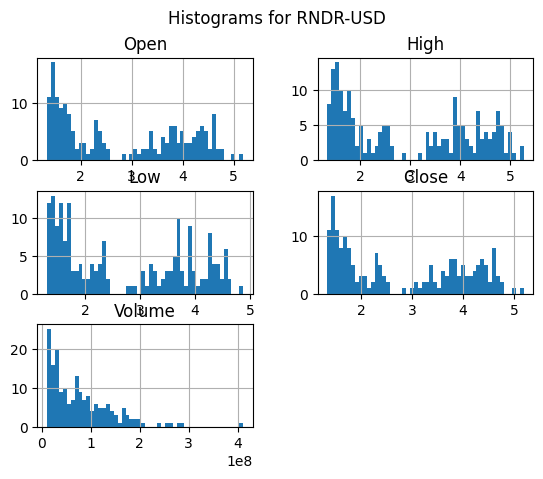

<Figure size 1000x600 with 0 Axes>

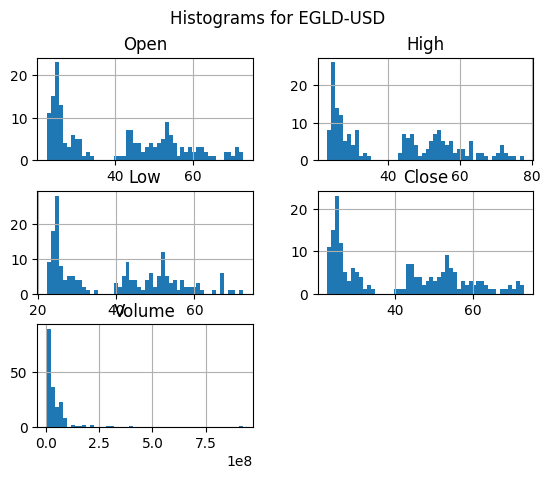

<Figure size 1000x600 with 0 Axes>

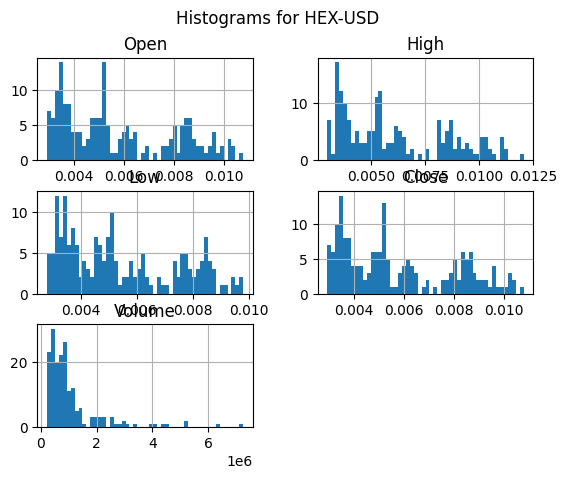

<Figure size 1000x600 with 0 Axes>

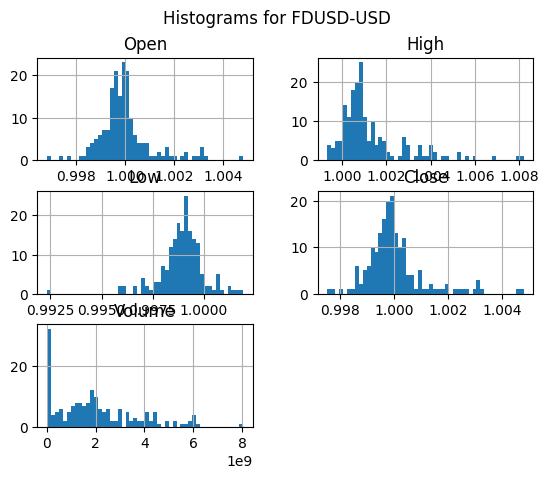

<Figure size 1000x600 with 0 Axes>

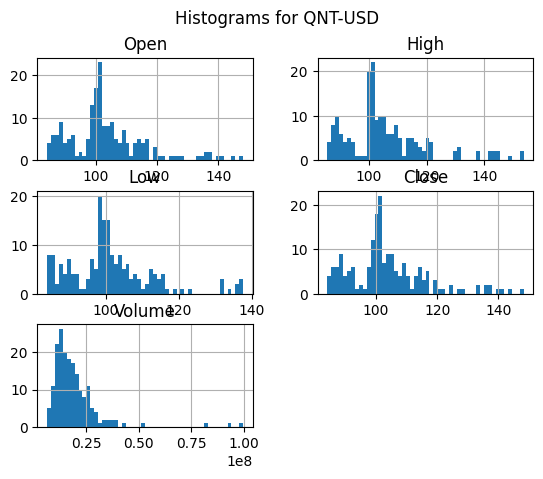

<Figure size 1000x600 with 0 Axes>

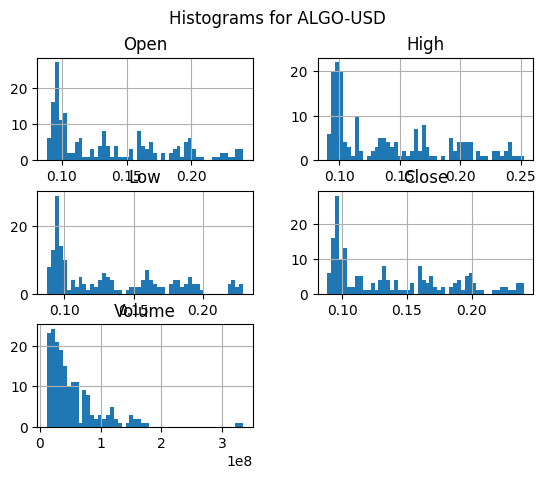

<Figure size 1000x600 with 0 Axes>

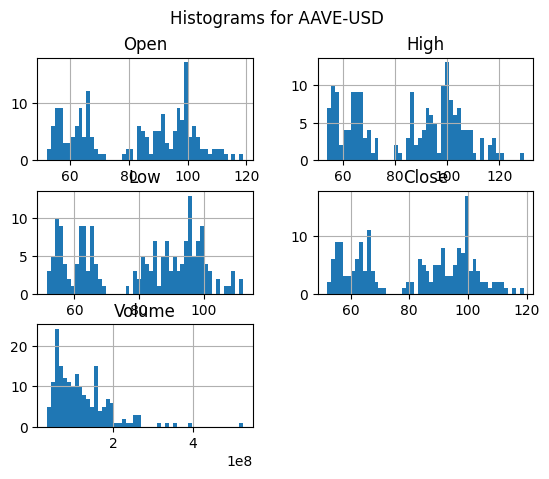

<Figure size 1000x600 with 0 Axes>

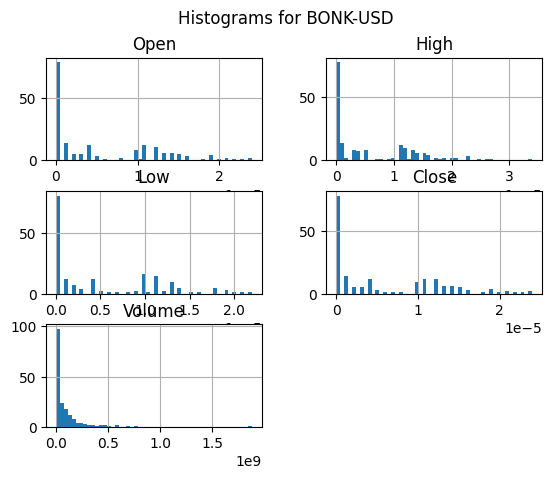

<Figure size 1000x600 with 0 Axes>

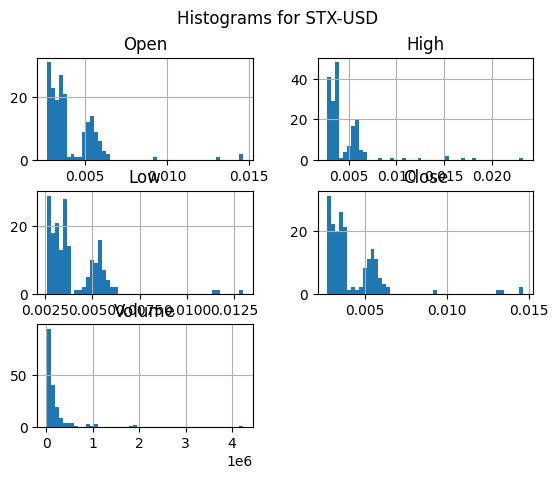

<Figure size 1000x600 with 0 Axes>

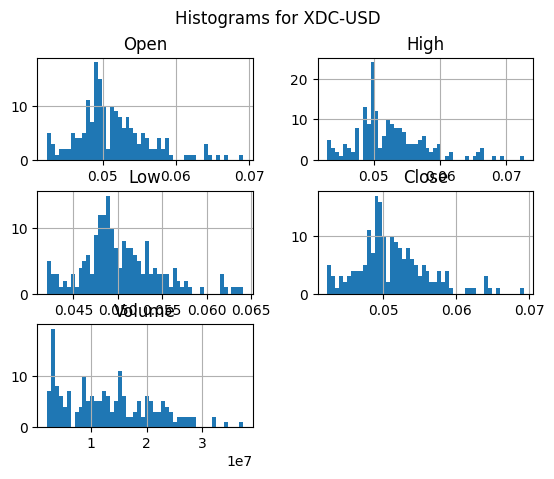

<Figure size 1000x600 with 0 Axes>

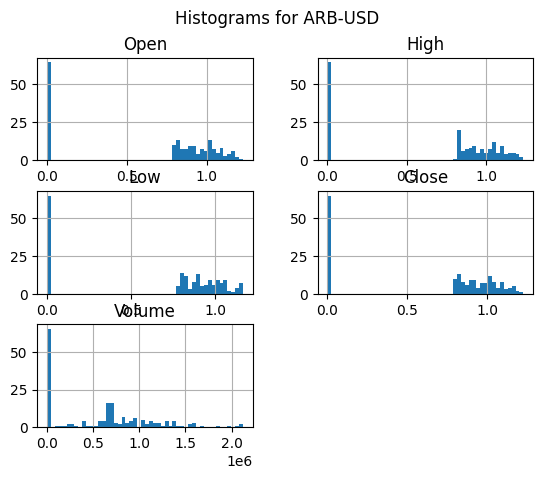

<Figure size 1000x600 with 0 Axes>

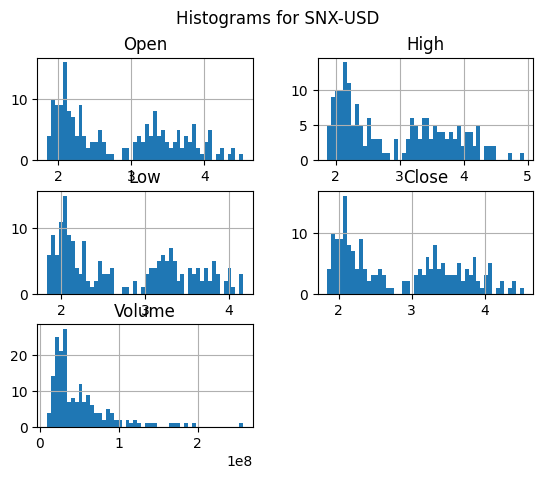

<Figure size 1000x600 with 0 Axes>

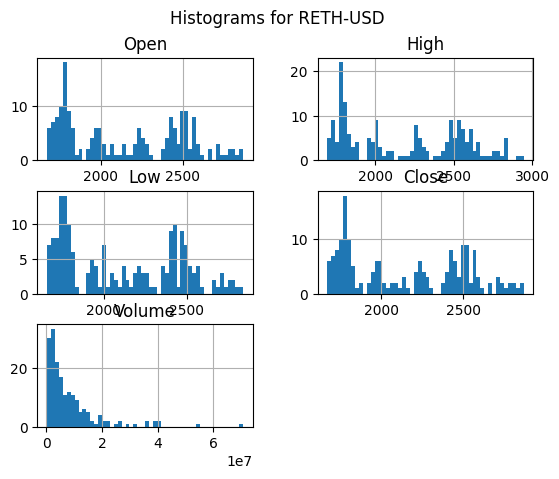

<Figure size 1000x600 with 0 Axes>

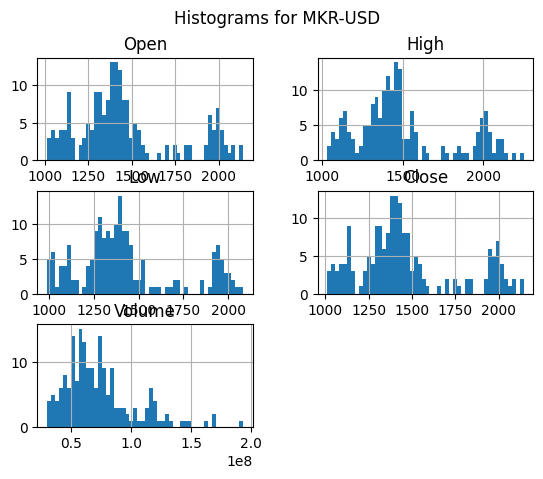

<Figure size 1000x600 with 0 Axes>

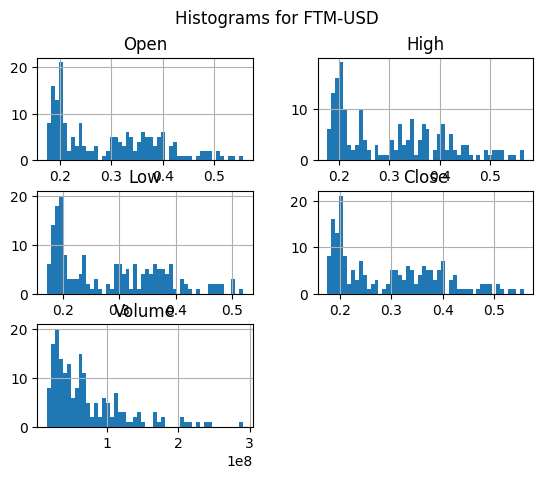

<Figure size 1000x600 with 0 Axes>

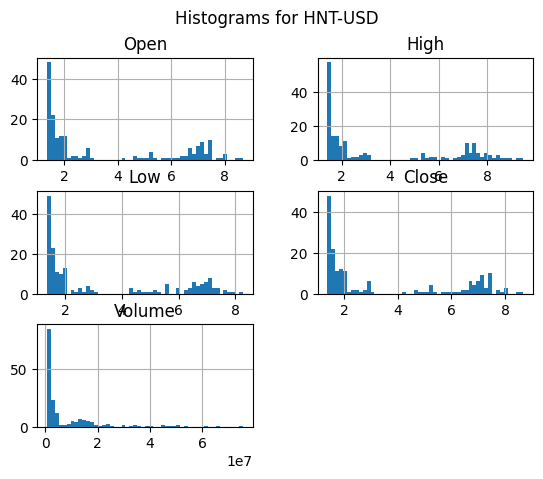

<Figure size 1000x600 with 0 Axes>

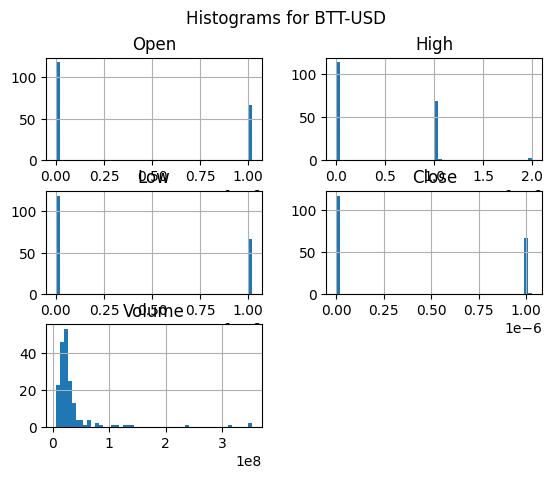

<Figure size 1000x600 with 0 Axes>

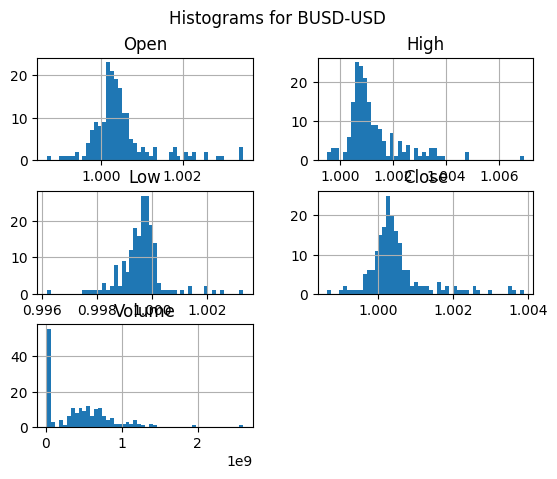

<Figure size 1000x600 with 0 Axes>

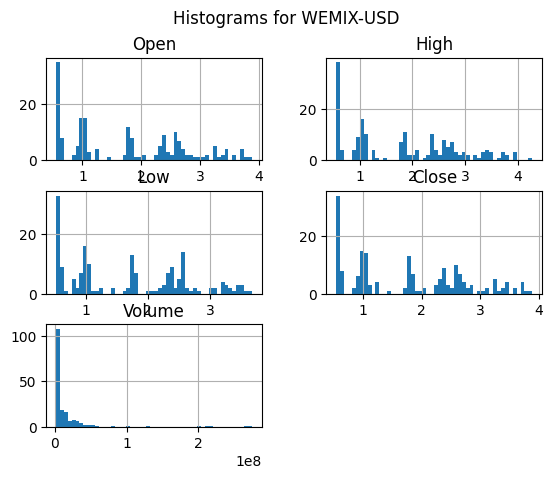

<Figure size 1000x600 with 0 Axes>

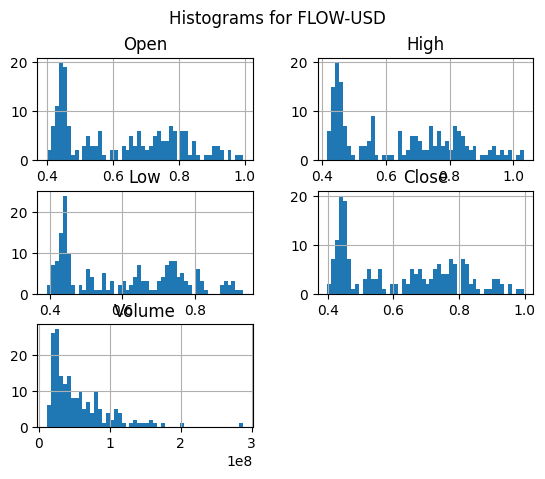

<Figure size 1000x600 with 0 Axes>

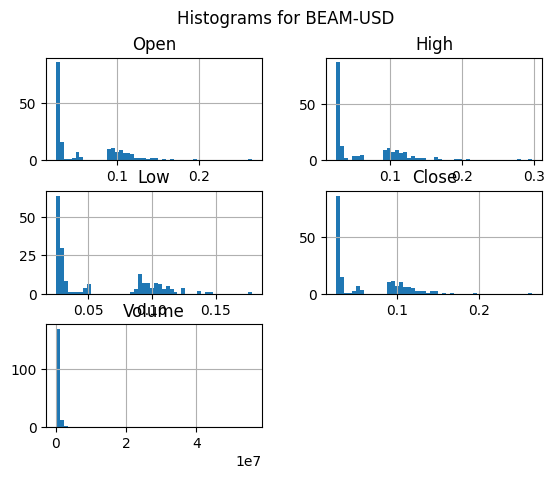

<Figure size 1000x600 with 0 Axes>

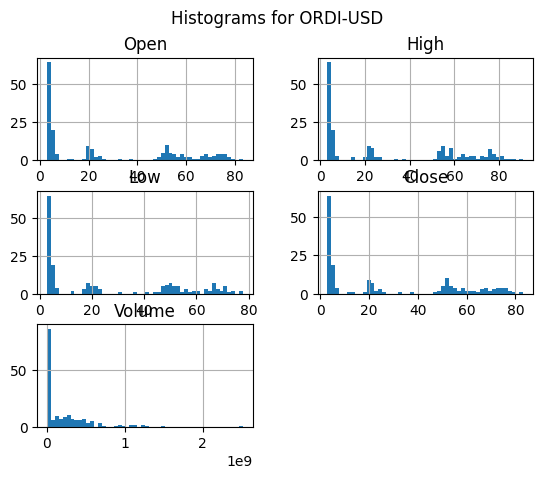

<Figure size 1000x600 with 0 Axes>

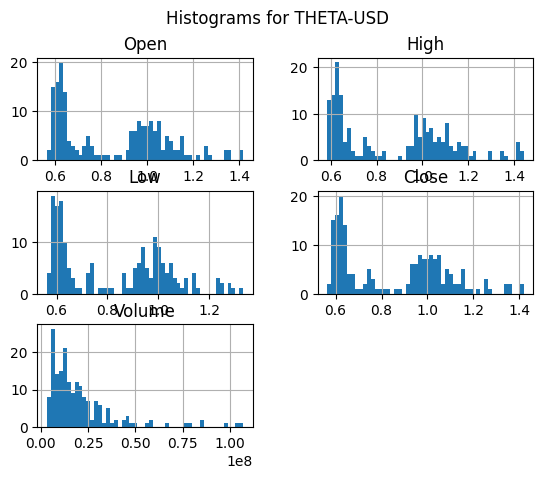

<Figure size 1000x600 with 0 Axes>

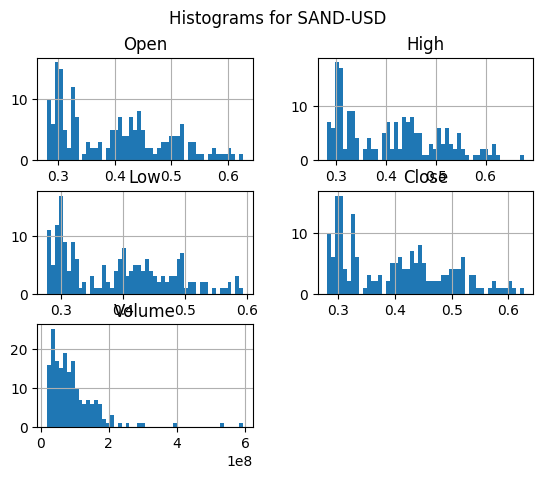

<Figure size 1000x600 with 0 Axes>

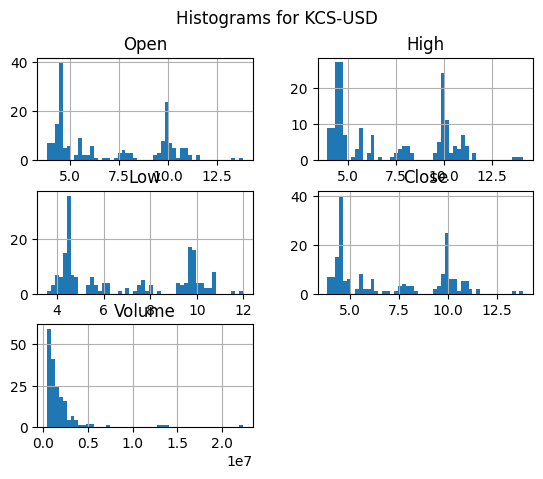

<Figure size 1000x600 with 0 Axes>

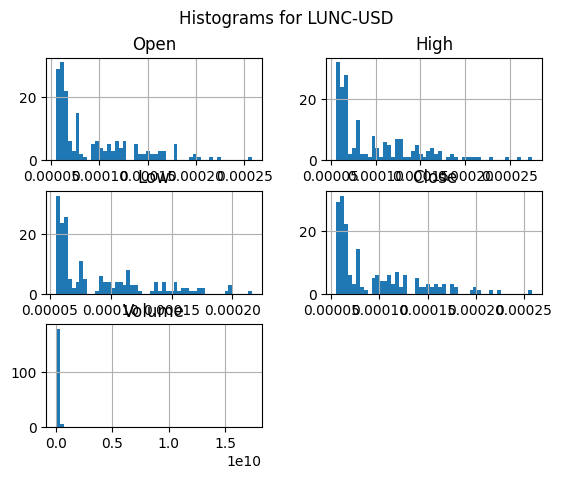

<Figure size 1000x600 with 0 Axes>

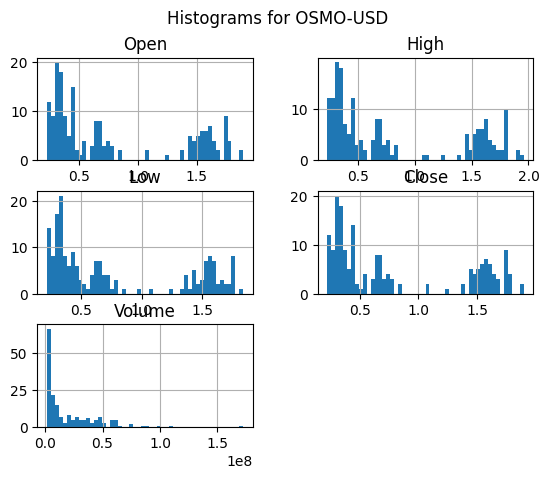

<Figure size 1000x600 with 0 Axes>

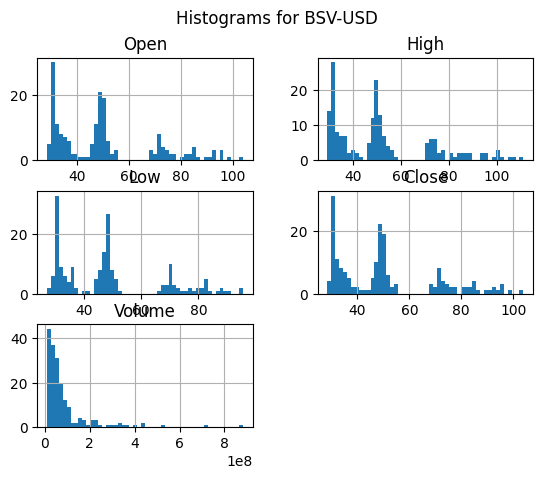

<Figure size 1000x600 with 0 Axes>

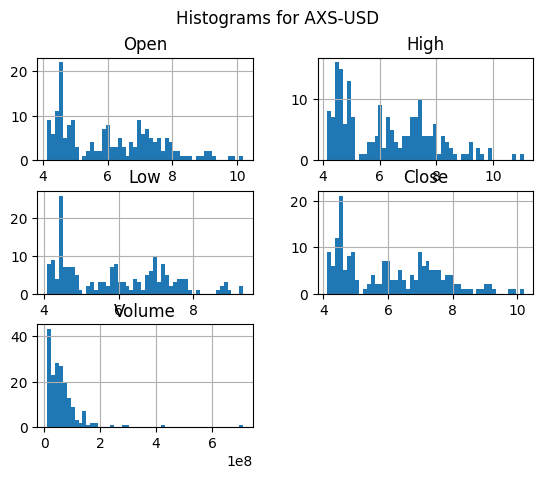

<Figure size 1000x600 with 0 Axes>

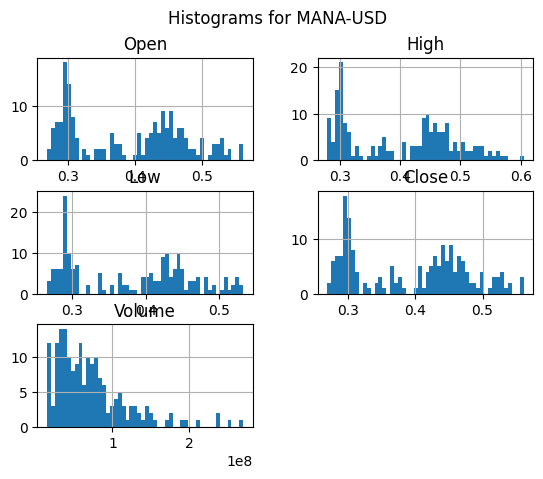

<Figure size 1000x600 with 0 Axes>

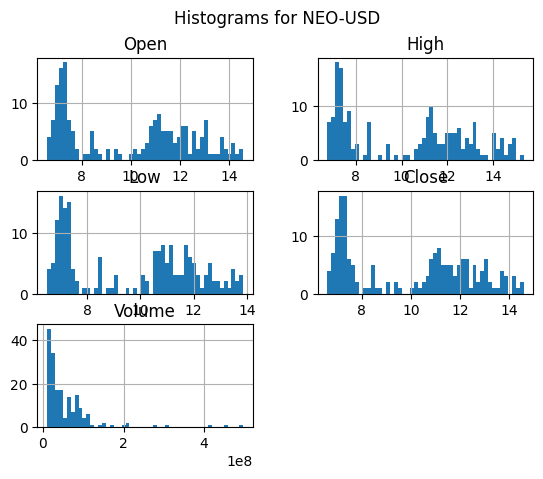

<Figure size 1000x600 with 0 Axes>

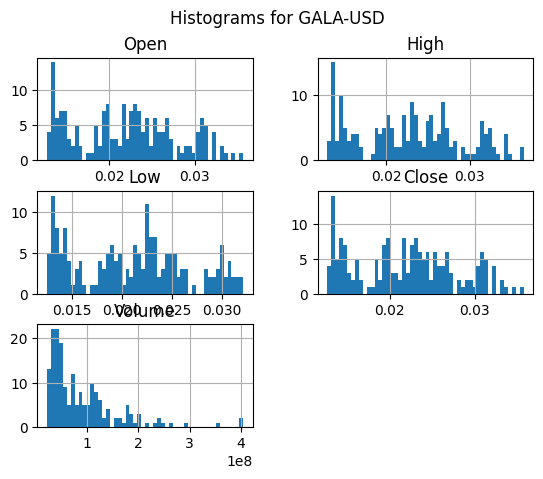

<Figure size 1000x600 with 0 Axes>

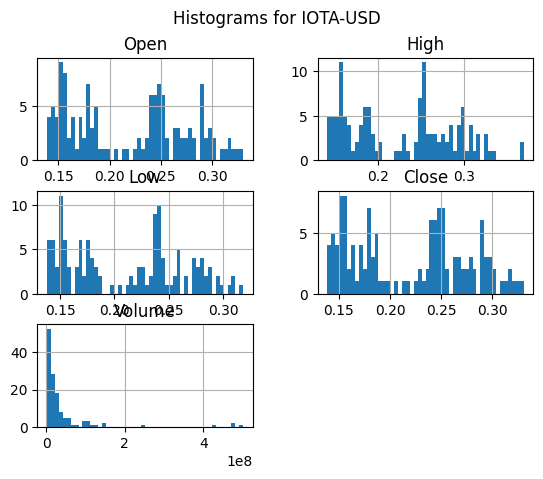

<Figure size 1000x600 with 0 Axes>

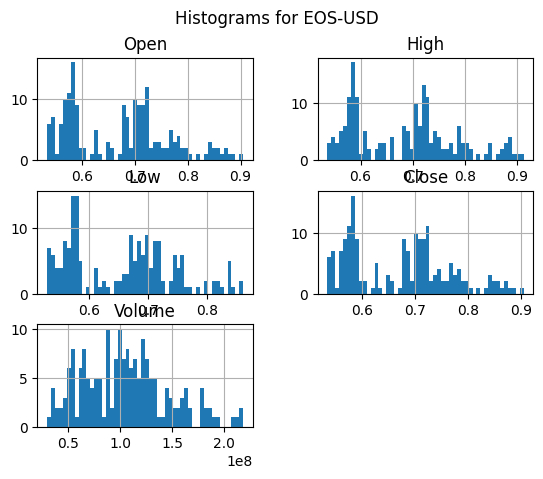

<Figure size 1000x600 with 0 Axes>

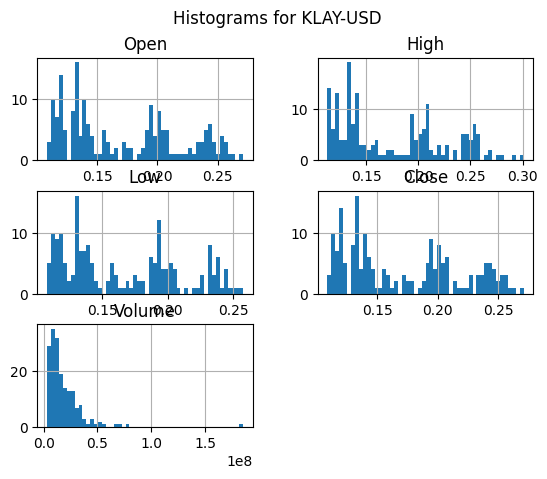

<Figure size 1000x600 with 0 Axes>

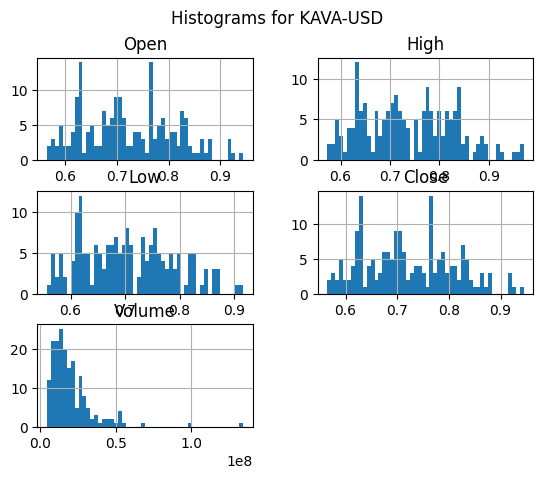

In [11]:
for ticker, df in CryptCurr_df.items():
    plt.figure(figsize=(10, 6))
    df.hist(bins=50)
    plt.suptitle(f"Histograms for {ticker}")
    plt.show()

Correlation Analysis

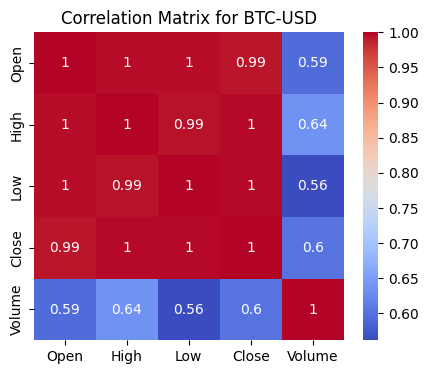

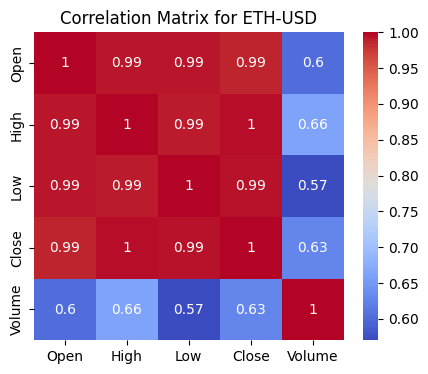

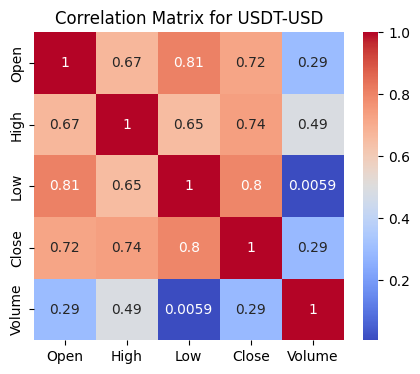

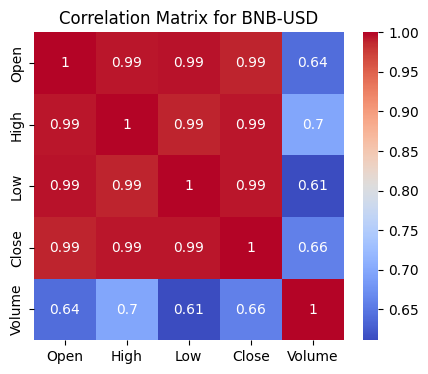

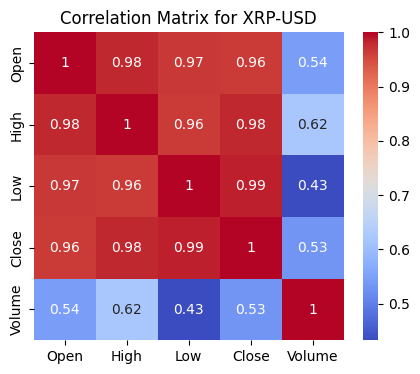

...

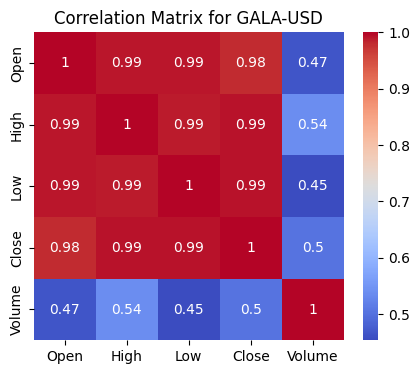

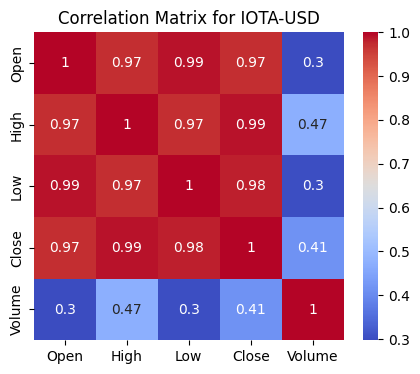

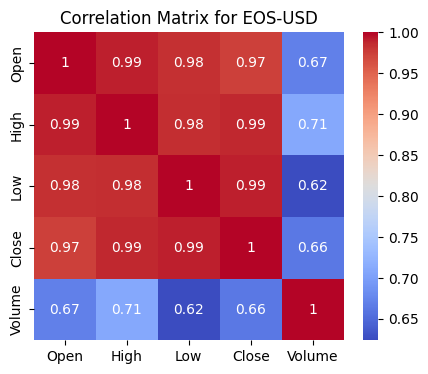

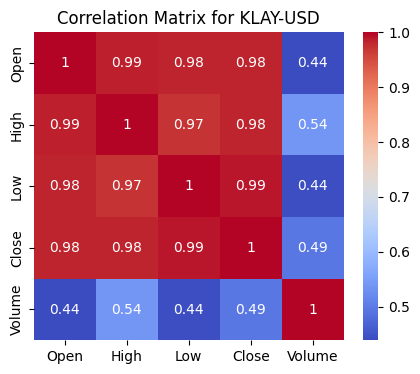

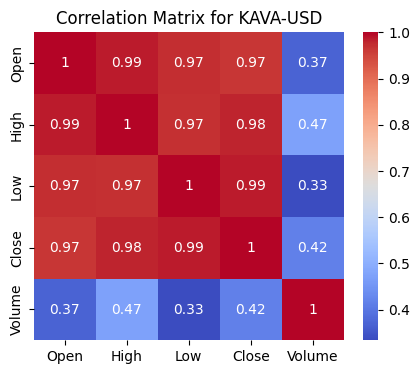

In [12]:
for ticker, df in CryptCurr_df.items():
    plt.figure(figsize=(5, 4))
    sns.heatmap(df.corr(), annot=True, cmap='coolwarm')
    plt.title(f"Correlation Matrix for {ticker}")
    plt.show()

Time Series Analysis

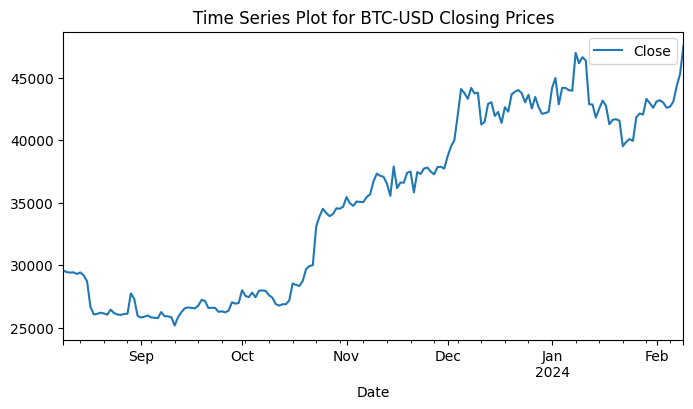

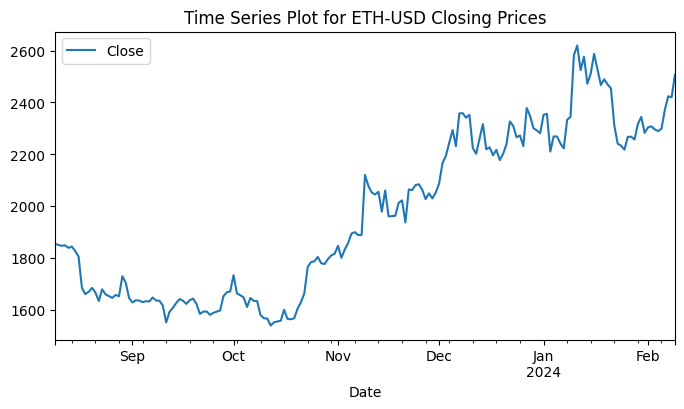

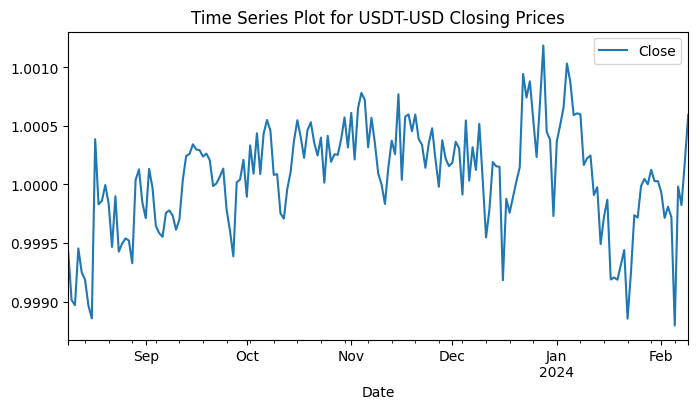

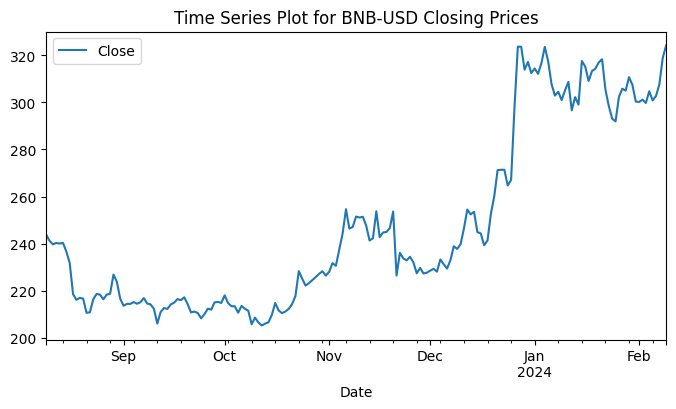

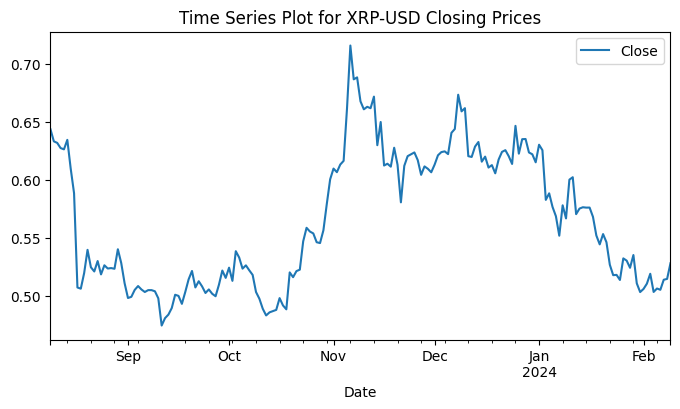

...

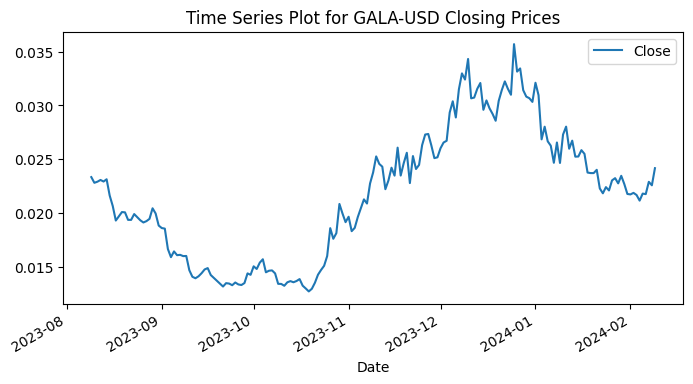

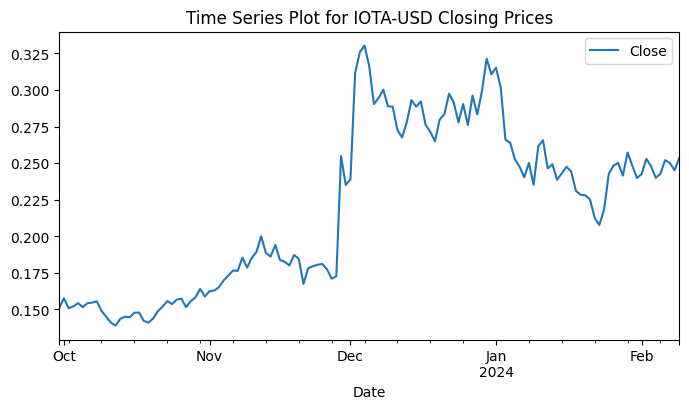

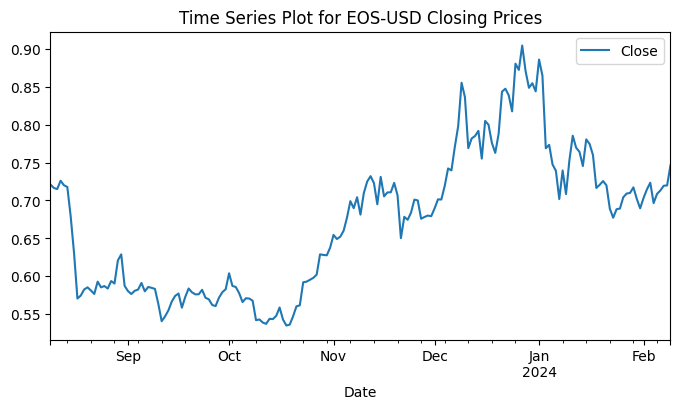

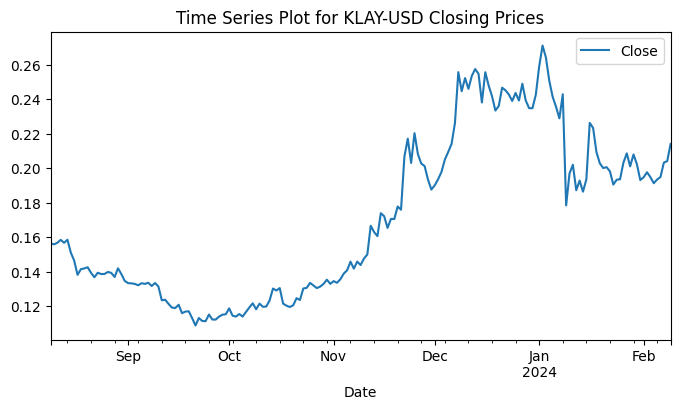

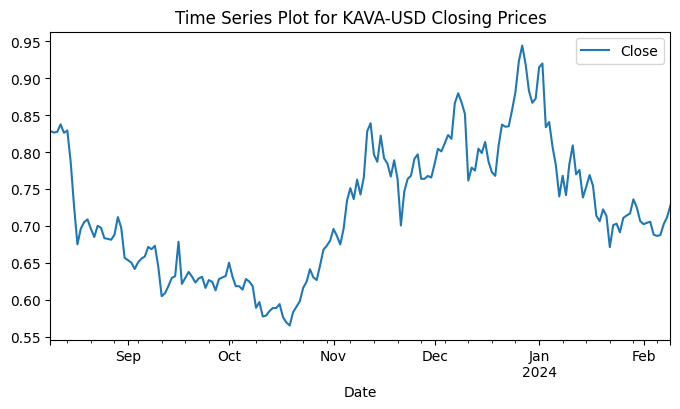

In [13]:
for ticker, df in CryptCurr_df.items():
    df[['Close']].plot(figsize=(8, 4))
    plt.title(f"Time Series Plot for {ticker} Closing Prices")
    plt.show()

Saving the data to an Excel file

In [14]:
!pip install xlsxwriter

In [15]:
# Create a path for the Excel file
path = 'Crypto_Data.xlsx'
with pd.ExcelWriter(path, engine='xlsxwriter') as writer:
    for ticker, df in CryptCurr_df.items():
        # Write each Data Frame to a different sheet
        df.to_excel(writer, sheet_name=ticker)

print(f"The Excel file has been successfully saved: {path}")

The Excel file has been successfully saved: Crypto_Data.xlsx


In [16]:
# To download the file in Google Colab
from google.colab import files
files.download(path)

<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

###Moving Averages
Simple Moving Average (SMA) and Exponential Moving Average (EMA)

In [17]:
def sma(series, window=20):
    return series.rolling(window=window).mean()

def ema(series, window=20):
    return series.ewm(span=window, adjust=False).mean()

for ticker, df in CryptCurr_df.items():
    df['SMA_20'] = sma(df['Close'], 20)
    df['EMA_20'] = ema(df['Close'], 20)

In [18]:
# After calculating the Moving Averages (SMA and EMA), display the first 5 rows.
print(df[['Close', 'SMA_20', 'EMA_20']].head())

               Close  SMA_20    EMA_20
Date                                  
2023-08-09  0.828559     NaN  0.828559
2023-08-10  0.826618     NaN  0.828374
2023-08-11  0.827563     NaN  0.828297
2023-08-12  0.837703     NaN  0.829193
2023-08-13  0.826261     NaN  0.828913


Relative Strength Index (RSI)

In [19]:
def rsi(series, window=14):
    delta = series.diff(1)
    gain = (delta.where(delta > 0, 0)).rolling(window=window).mean()
    loss = (-delta.where(delta < 0, 0)).rolling(window=window).mean()
    rs = gain / loss
    return 100 - (100 / (1 + rs))

for ticker, df in CryptCurr_df.items():
    df['RSI_14'] = rsi(df['Close'], 14)


In [20]:
# After calculating the RSI, display the first 5 rows.
print(df[['Close', 'RSI_14']].head())

               Close  RSI_14
Date                        
2023-08-09  0.828559     NaN
2023-08-10  0.826618     NaN
2023-08-11  0.827563     NaN
2023-08-12  0.837703     NaN
2023-08-13  0.826261     NaN


Daily Return

In [21]:
for ticker, df in CryptCurr_df.items():
    df['Daily_Return'] = df['Close'].pct_change()

In [22]:
# After calculating the daily return, display the first 5 rows.
print(df[['Close', 'Daily_Return']].head())

               Close  Daily_Return
Date                              
2023-08-09  0.828559           NaN
2023-08-10  0.826618     -0.002343
2023-08-11  0.827563      0.001143
2023-08-12  0.837703      0.012253
2023-08-13  0.826261     -0.013659


Volatility

In [23]:
for ticker, df in CryptCurr_df.items():
    df['Volatility'] = df['Daily_Return'].rolling(window=20).std() * (252 ** 0.5)  # Annualized Volatility

In [24]:
# Print the first five rows after calculating the volatility.
print(df[['Close', 'Volatility']].head())

               Close  Volatility
Date                            
2023-08-09  0.828559         NaN
2023-08-10  0.826618         NaN
2023-08-11  0.827563         NaN
2023-08-12  0.837703         NaN
2023-08-13  0.826261         NaN


###Feature Selection
Correlation Analysis and Feature Selection

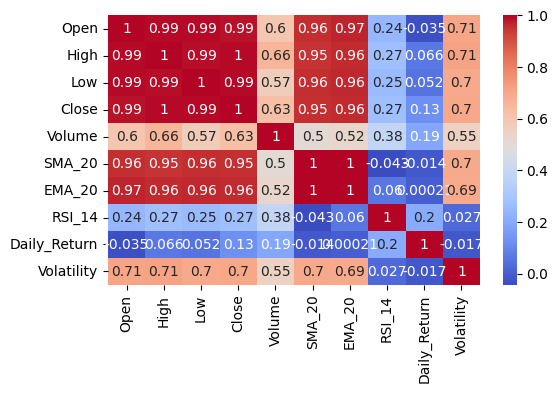

In [25]:
# plotting the correlation matrix of features for a cryptocurrency
plt.figure(figsize=(6, 3.5))
sns.heatmap(CryptCurr_df['ETH-USD'].corr(), annot=True, cmap='coolwarm')
plt.show()

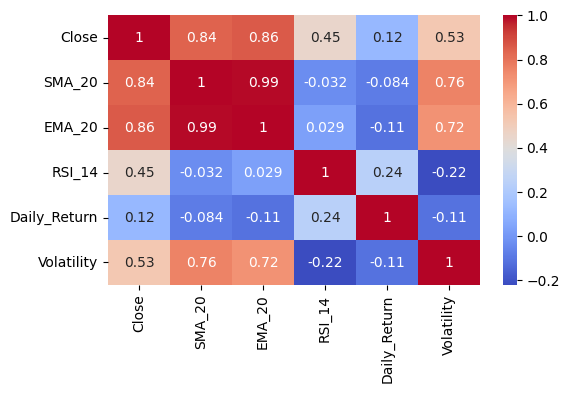

In [26]:
# Plotting the correlation matrix of features
plt.figure(figsize=(6, 3.5))
sns.heatmap(df[['Close', 'SMA_20', 'EMA_20', 'RSI_14', 'Daily_Return', 'Volatility']].corr(), annot=True, cmap='coolwarm')
plt.show()

# Data Normalization

### Min-Max Normalization

In [27]:
from sklearn.preprocessing import MinMaxScaler

# Create an instance of MinMaxScaler
scaler = MinMaxScaler()

# Determine a subset of features
features_to_scale = ['Open', 'High', 'Low', 'Close', 'Volume']

# Normalize the data and overwrite the same DataFrame with the result
for ticker, df in CryptCurr_df.items():
    df[features_to_scale] = scaler.fit_transform(df[features_to_scale])

    # Show the first five rows after normalization
    print(f"{ticker} - First 5 rows:")
    print(df[features_to_scale].head())

BTC-USD - First 5 rows:
                Open      High       Low     Close    Volume
Date                                                        
2023-08-09  0.211025  0.183249  0.214306  0.196411  0.291365
2023-08-10  0.201737  0.165730  0.213229  0.190521  0.145906
2023-08-11  0.195366  0.158340  0.208365  0.189098  0.108611
2023-08-12  0.194215  0.156062  0.213380  0.189913  0.019275
2023-08-13  0.194985  0.155037  0.208957  0.183972  0.044631
ETH-USD - First 5 rows:
                Open      High       Low     Close    Volume
Date                                                        
2023-08-09  0.292983  0.269031  0.308447  0.291373  0.140519
2023-08-10  0.291657  0.263444  0.308402  0.288092  0.062264
2023-08-11  0.288317  0.256275  0.302780  0.284732  0.047158
2023-08-12  0.285011  0.253853  0.308667  0.286366  0.007771
2023-08-13  0.286754  0.260492  0.298220  0.277468  0.036090
USDT-USD - First 5 rows:
                Open      High       Low     Close    Volume
Date        

### Z-Score Normalization (Standardization)

In [28]:
from sklearn.preprocessing import StandardScaler

# Create a StandardScaler instant
scaler = StandardScaler()

# Normalize the data and overwrite the same DataFrame with the result
for ticker, df in CryptCurr_df.items():
    df[features_to_scale] = scaler.fit_transform(df[features_to_scale])

    # Show the first five rows after normalization
    print(f"{ticker} - First 5 rows:")
    print(df[features_to_scale].head())

BTC-USD - First 5 rows:
                Open      High       Low     Close    Volume
Date                                                        
2023-08-09 -0.727983 -0.743218 -0.730639 -0.764968 -0.029860
2023-08-10 -0.756468 -0.798371 -0.733872 -0.783374 -0.741333
2023-08-11 -0.776008 -0.821637 -0.748467 -0.787822 -0.923748
2023-08-12 -0.779537 -0.828810 -0.733418 -0.785276 -1.360713
2023-08-13 -0.777175 -0.832036 -0.746690 -0.803842 -1.236690
ETH-USD - First 5 rows:
                Open      High       Low     Close    Volume
Date                                                        
2023-08-09 -0.353951 -0.405707 -0.291294 -0.366929 -0.571003
2023-08-10 -0.358519 -0.425380 -0.291451 -0.378156 -1.037207
2023-08-11 -0.370030 -0.450622 -0.310841 -0.389651 -1.127205
2023-08-12 -0.381423 -0.459149 -0.290536 -0.384058 -1.361856
2023-08-13 -0.375417 -0.435772 -0.326572 -0.414498 -1.193143
USDT-USD - First 5 rows:
                Open      High       Low     Close    Volume
Date        

In [29]:
# Fill NaN values with 0 after normalizing data
for ticker, df in CryptCurr_df.items():
    df.fillna(0, inplace=True)
    print(f"\n{ticker} - DataFrame after filling NaN values:")
    print(df.head())


BTC-USD - DataFrame after filling NaN values:
                Open      High       Low     Close    Volume  SMA_20  \
Date                                                                   
2023-08-09 -0.727983 -0.743218 -0.730639 -0.764968 -0.029860     0.0   
2023-08-10 -0.756468 -0.798371 -0.733872 -0.783374 -0.741333     0.0   
2023-08-11 -0.776008 -0.821637 -0.748467 -0.787822 -0.923748     0.0   
2023-08-12 -0.779537 -0.828810 -0.733418 -0.785276 -1.360713     0.0   
2023-08-13 -0.777175 -0.832036 -0.746690 -0.803842 -1.236690     0.0   

                  EMA_20  RSI_14  Daily_Return  Volatility  
Date                                                        
2023-08-09  29561.494141     0.0      0.000000         0.0  
2023-08-10  29548.932013     0.0     -0.004462         0.0  
2023-08-11  29534.530378     0.0     -0.001083         0.0  
2023-08-12  29523.238422     0.0      0.000621         0.0  
2023-08-13  29500.350388     0.0     -0.004523         0.0  

ETH-USD - DataFrame 

# Sending Data to Kafka

### Establishing Kafka Producer and Sending Data Streams

In [30]:
from kafka import KafkaProducer
import json

# Kafka Producer Settings
kafka_producer = KafkaProducer(bootstrap_servers=['localhost:9092'],  # Kafka server address
                         value_serializer=lambda x: json.dumps(x).encode('utf-8'))  # Convert the data to JSON format

# Function for sending data to Kafka topic
def send_data_to_kafka(topic_name, data):
    kafka_producer.send(topic_name, value=data)
    kafka_producer.flush()

# Example data transmission
for ticker, df in CryptCurr_df.items():
    topic_name = f"crypto_data_{ticker.lower()}"  # Specify the topic name
    data = df.to_json(orient='records')  # Convert DataFrame to JSON
    send_data_to_kafka(topic_name, data)  # Send data to Kafka

kafka_producer.close()  # Close the producer

In [31]:
from kafka import KafkaConsumer

# Create a Kafka consumer to access metadata (we won't use it to consume messages)
group_id = 'my-consumer-group'
kafka_consumer = KafkaConsumer(bootstrap_servers=['localhost:9092'], group_id=group_id)

# Fetch and print the list of topics
topics = kafka_consumer.topics()
topics_count = len(topics)
print("\nNumber of topics is: ", topics_count, "\n")
print("Available Topics in Kafka for each CryptoCurrency USD pairs:\n")
for counter, topic in enumerate(topics, 1):  # Counter starts at 1
    print(f"Topic {counter}: {topic}")

# Close the consumer
kafka_consumer.close()


Number of topics is:  81 

Available Topics in Kafka for each CryptoCurrency USD pairs:

Topic 1: crypto_data_cfx-usd
Topic 2: crypto_data_bsv-usd
Topic 3: crypto_data_neo-usd
Topic 4: crypto_data_trx-usd
Topic 5: crypto_data_vet-usd
Topic 6: crypto_data_bonk-usd
Topic 7: crypto_data_wemix-usd
Topic 8: crypto_data_hex-usd
Topic 9: crypto_data_snx-usd
Topic 10: crypto_data_tusd-usd
Topic 11: crypto_data_bch-usd
Topic 12: crypto_data_busd-usd
Topic 13: crypto_data_sol-usd
Topic 14: crypto_data_osmo-usd
Topic 15: crypto_data_btc-usd
Topic 16: crypto_data_dot-usd
Topic 17: crypto_data_whbar-usd
Topic 18: crypto_data_kava-usd
Topic 19: crypto_data_avax-usd
Topic 20: crypto_data_ada-usd
Topic 21: crypto_data_ftm-usd
Topic 22: crypto_data_ltc-usd
Topic 23: crypto_data_kas-usd
Topic 24: crypto_data_matic-usd
Topic 25: crypto_data_fil-usd
Topic 26: crypto_data_lunc-usd
Topic 27: crypto_data_fdusd-usd
Topic 28: crypto_data_algo-usd
Topic 29: crypto_data_gala-usd
Topic 30: crypto_data_rune-usd
T

In [32]:
def topic_messages(topic_name):
    kafka_consumer = KafkaConsumer(
        topic_name,
        bootstrap_servers='localhost:9092',
        auto_offset_reset='earliest',
        group_id='my-new-print-group',
        value_deserializer=lambda m: json.loads(m.decode('utf-8')))

    try:
        # Consume messages from the topic with a timeout
        for _ in range(100):  # Limit the number of polls
            msg_pack = kafka_consumer.poll(timeout_ms=1000)  # Poll for 1 second
            for tp, messages in msg_pack.items():
                for message in messages:
                    print(f"Message in {topic_name}: {message.value}")

            if not msg_pack:  # Break if no new messages
                break
    finally:
        kafka_consumer.close()

for topic in topics:
    topic_messages(topic)


Message in crypto_data_cfx-usd: [{"Open":0.5322004691,"High":0.4056095195,"Low":0.711047826,"Close":0.5562761173,"Volume":-0.6497454066,"SMA_20":0.0,"EMA_20":0.1786150038,"RSI_14":0.0,"Daily_Return":0.0,"Volatility":0.0},{"Open":0.5700089554,"High":0.4929098973,"Low":0.7353832756,"Close":0.508767486,"Volume":-0.6380388265,"SMA_20":0.0,"EMA_20":0.1784638606,"RSI_14":0.0,"Daily_Return":-0.0088850513,"Volatility":0.0},{"Open":0.5223095787,"High":0.3504987353,"Low":0.6819741995,"Close":0.5584315859,"Volume":-0.8065061947,"SMA_20":0.0,"EMA_20":0.1784851126,"RSI_14":0.0,"Daily_Return":0.0093714321,"Volatility":0.0},{"Open":0.5724283812,"High":0.3769373346,"Low":0.7682925921,"Close":0.5710044087,"Volume":-0.9087756153,"SMA_20":0.0,"EMA_20":0.1785443395,"RSI_14":0.0,"Daily_Return":0.0023504184,"Volatility":0.0},{"Open":0.5848901369,"High":0.4385250597,"Low":0.7780590482,"Close":0.5617245636,"Volume":-0.8270146967,"SMA_20":0.0,"EMA_20":0.1785684031,"RSI_14":0.0,"Daily_Return":-0.0017307468,"Vol

# Processing with Spark

In [33]:
from pyspark.sql import SparkSession
from pyspark.sql import DataFrame
from pyspark.ml.stat import Correlation
from pyspark.ml.feature import VectorAssembler
from pyspark.ml.clustering import KMeans
from pyspark.ml.evaluation import ClusteringEvaluator
from pyspark.sql.functions import count
from sklearn.impute import SimpleImputer

### Creating a Spark Session

In [34]:
from pyspark.sql import SparkSession

spark = SparkSession.builder \
    .appName("Crypto Data Analysis") \
    .getOrCreate()

### Loading Data into a Spark DataFrame

In [35]:
# Converting the Pandas DataFrame to a Spark DataFrame
crypto_data_sdf = spark.createDataFrame(df)

In [36]:
# Function to convert a Pandas DataFrame to a Spark DataFrame
def convert2spark(pandas_df):
    return spark.createDataFrame(pandas_df)

# Dictionary to hold Spark DataFrames
SparkCrypto_df = {}

# Convert each Pandas DataFrame to Spark DataFrame
for ticker, pandas_df in CryptCurr_df.items():
    spark_df = convert2spark(pandas_df)
    SparkCrypto_df[ticker] = spark_df

# Example usage of Spark DataFrame
for ticker, spark_df in SparkCrypto_df.items():
    spark_df.show(5)

+-------------------+-------------------+-------------------+-------------------+--------------------+------+------------------+------+--------------------+----------+
|               Open|               High|                Low|              Close|              Volume|SMA_20|            EMA_20|RSI_14|        Daily_Return|Volatility|
+-------------------+-------------------+-------------------+-------------------+--------------------+------+------------------+------+--------------------+----------+
|-0.7279832437155477|-0.7432180270158054|-0.7306393026184461|-0.7649681568041843|-0.02985982600814...|   0.0|   29561.494140625|   0.0|                 0.0|       0.0|
|-0.7564675005479534|-0.7983709737779477| -0.733871801094041|-0.7833740021250435|  -0.741332510194085|   0.0| 29548.93201264881|   0.0|-0.00446196471404...|       0.0|
|-0.7760080618857436|-0.8216367191908184|-0.7484670471599948|-0.7878221586311253| -0.9237477451571428|   0.0|29534.530377515588|   0.0|-0.00108315988019...|    

In [37]:
from sklearn.preprocessing import StandardScaler

# Combine DataFrames into one DataFrame
merged_df = pd.DataFrame()
for ticker, df in CryptCurr_df.items():
    df['Ticker'] = ticker  # Add ticker information
    merged_df = pd.concat([merged_df, df])

# Selecting features for clustering (excluding 'Ticker')
cluster_features = merged_df.drop(['Ticker'], axis=1)

# Replace inf/-inf with NaN
cluster_features.replace([np.inf, -np.inf], np.nan, inplace=True)

# Fill NaN values with the mean of each column
imputer = SimpleImputer(strategy='mean')
cluster_features_filled = imputer.fit_transform(cluster_features)

# Scale the features (important for KMeans)
scaler = StandardScaler()
cluster_features_scaled = scaler.fit_transform(cluster_features_filled)


# Clustering and Evaluation

In [38]:
from sklearn.cluster import KMeans

# Applying KMeans clustering
k = 4
kmeans = KMeans(n_clusters=k, random_state=0, n_init=10)
kmeans.fit(cluster_features_scaled)

# Adding cluster labels to the DataFrame
merged_df['Cluster'] = kmeans.labels_

# Group the DataFrame by cluster
groupby_cluster = merged_df.groupby('Cluster')

# Displaying the cryptocurrencies in each cluster
for cluster, group in groupby_cluster:
    print(f"Cryptocurrencies in Cluster {cluster}:")
    print(group['Ticker'].unique())
    print("\n")

Cryptocurrencies in Cluster 0:
['ETH-USD' 'USDT-USD' 'BNB-USD' 'XRP-USD' 'WXRP-USD' 'SOL-USD' 'USDC-USD'
 'ADA-USD' 'STETH-USD' 'AVAX-USD' 'DOGE-USD' 'DOT-USD' 'WOO-USD' 'TRX-USD'
 'LINK-USD' 'MATIC-USD' 'SHIB-USD' 'LTC-USD' 'DAI-USD' 'UNI-USD' 'BCH-USD'
 'ICP-USD' 'XLM-USD' 'OKB-USD' 'LEO-USD' 'ATOM-USD' 'ETC-USD' 'HBAR-USD'
 'CRO-USD' 'INJ-USD' 'WHBAR-USD' 'CFX-USD' 'KAS-USD' 'FIL-USD' 'APT-USD'
 'TUSD-USD' 'NEAR-USD' 'VET-USD' 'TIA-USD' 'OP-USD' 'LDO-USD' 'MNT-USD'
 'RUNE-USD' 'RNDR-USD' 'EGLD-USD' 'HEX-USD' 'FDUSD-USD' 'QNT-USD'
 'ALGO-USD' 'AAVE-USD' 'BONK-USD' 'STX-USD' 'XDC-USD' 'ARB-USD' 'SNX-USD'
 'RETH-USD' 'MKR-USD' 'FTM-USD' 'HNT-USD' 'BTT-USD' 'BUSD-USD' 'WEMIX-USD'
 'FLOW-USD' 'BEAM-USD' 'ORDI-USD' 'THETA-USD' 'SAND-USD' 'KCS-USD'
 'LUNC-USD' 'OSMO-USD' 'BSV-USD' 'AXS-USD' 'MANA-USD' 'NEO-USD' 'GALA-USD'
 'IOTA-USD' 'EOS-USD' 'KLAY-USD' 'KAVA-USD']


Cryptocurrencies in Cluster 1:
['ETH-USD' 'USDT-USD' 'BNB-USD' 'XRP-USD' 'WXRP-USD' 'SOL-USD' 'USDC-USD'
 'ADA-USD' 'STETH-

In [39]:
data_json = data
#Convert the string to a Python dictionary
data_dict = json.loads(data_json)

# Convert the Python dictionary to a pandas DataFrame
data_df = pd.DataFrame(data_dict)

# Check the DataFrame
print(data_df.head())

       Open      High       Low     Close    Volume  SMA_20    EMA_20  RSI_14  \
0  1.274061  1.058139  1.442769  1.228832 -0.783942     0.0  0.828559     0.0   
1  1.218736  1.074569  1.485753  1.206638 -0.705894     0.0  0.828374     0.0   
2  1.194420  1.017366  1.420722  1.217444 -0.919545     0.0  0.828297     0.0   
3  1.207420  1.141714  1.516038  1.333390 -0.890722     0.0  0.829193     0.0   
4  1.320757  1.203812  1.489324  1.202556 -0.694795     0.0  0.828913     0.0   

   Daily_Return  Volatility  
0      0.000000         0.0  
1     -0.002343         0.0  
2      0.001143         0.0  
3      0.012253         0.0  
4     -0.013659         0.0  


Clustering Evaluation using Silhouette Method

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:8

Silhouette Score for k=2: 0.5265902804438981
Silhouette Score for k=3: 0.6034042136640041
Silhouette Score for k=4: 0.5525332512789466
Silhouette Score for k=5: 0.5288254129672583


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score for k=6: 0.5049644765646174
Silhouette Score for k=7: 0.47797913483296683
Silhouette Score for k=8: 0.471751373300849


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score for k=9: 0.44812849733590676
Silhouette Score for k=10: 0.43188068972708316


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


Silhouette Score for k=11: 0.43056344463585167


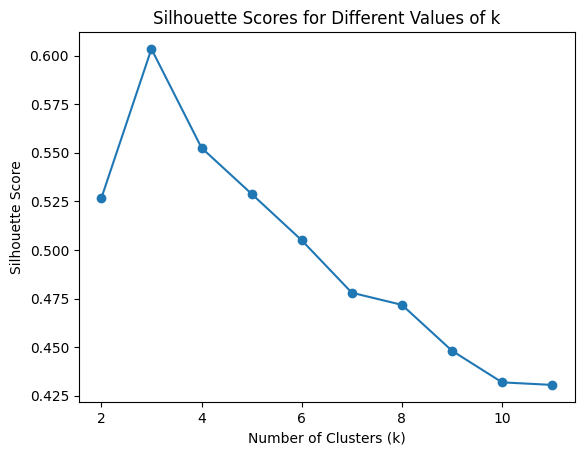

In [40]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

data = pd.DataFrame(json.loads(data_json))

# Range of k values to try (for example, 2 to 11)
k_values = range(2, 12)

# Store average silhouette scores for each k
silhouette_scores = []

for k in k_values:
    # The KMeans class is being used correctly
    kmeans = KMeans(n_clusters=k, random_state=42)
    cluster_labels = kmeans.fit_predict(data)

    # Calculate the silhouette score and append it to the list
    silhouette_avg = silhouette_score(data, cluster_labels)
    silhouette_scores.append(silhouette_avg)
    print(f"Silhouette Score for k={k}: {silhouette_avg}")

# Plotting the silhouette scores
plt.plot(k_values, silhouette_scores, marker='o')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Silhouette Score')
plt.title('Silhouette Scores for Different Values of k')
plt.show()

Visualization

/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(


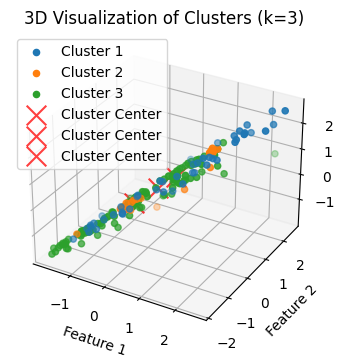

In [42]:
from mpl_toolkits.mplot3d import Axes3D

# Annotating the point of the highest silhouette score
optimal_k = k_values[silhouette_scores.index(max(silhouette_scores))]

# Fit KMeans with the optimal number of clusters
kmeans = KMeans(n_clusters=optimal_k, random_state=42)
clusters = kmeans.fit_predict(data)
centers = kmeans.cluster_centers_

# The data has three features for plotting
feature1 = data.iloc[:, 0]
feature2 = data.iloc[:, 1]
feature3 = data.iloc[:, 2]

# Create a 3D scatter plot
fig = plt.figure(figsize=(6, 4))
ax = fig.add_subplot(111, projection='3d')

# Scatter plot points for each cluster
for cluster_num in range(optimal_k):
    ax.scatter(feature1[clusters == cluster_num],
               feature2[clusters == cluster_num],
               feature3[clusters == cluster_num],
               label=f'Cluster {cluster_num+1}')

# Mark cluster centers
for center in centers:
    ax.scatter(center[0], center[1], center[2],
               c='red', s=200, alpha=0.75, marker='x', label='Cluster Center')

# Set labels and title
ax.set_xlabel('Feature 1')
ax.set_ylabel('Feature 2')
ax.set_zlabel('Feature 3')
ax.set_title(f'3D Visualization of Clusters (k={optimal_k})')
ax.legend()
plt.show()